# *Indian Institute of Technology Bombay*
## EE 782 : Advanced Topics in Machine Learning
## Assignment - 2
## Siamese Networks & C-GAN (Part-A)

### by:
### Uddeshya Singh
### Rollno: 22m2152  
### Contact no.: 8755599692
### CMiNDS , Artifical Intellligence & Data Science

*********************

### **Modules Covered**

*********************

1. ##### Dataset analysis:
    - Reading and visualising DataSet 
    - Person with more than one Image
    - Avg image per person
   
*********************    
    
2. ##### Train, Valid and Test Set Split 
    - Person with more than image vs Person with single image 
 
*********************

3. ##### Data Augmentation and Processing
    - Crop and Resize
    - Data Augmentation
    
*********************

4. ##### Dataset and DataLoaders
    - Making the Dictionary
    - Positive and Negative Pair Creation
    - Dataset Creation
    - Dataloader Creation

*********************
5. ##### Pretained Model Used
    - EfficientNet B0
    - ResNet - 18
    - ResNet - 34
  
*********************

6. ##### Losses Used
    - Cross-Entropy loss with Cosine similarity 
    - Hinge Loss with Eucledian distance

*********************

7. ##### Regularisation Used
    - Weight Decay
    - Early Stopping
    - Dropout

*********************

8. ##### Optimiser Used
    - SGD with Momentum
    - Adagrad
    - Adam

*********************
8. ##### Learning Rate Scheduler Used
    - StepLR
    - ExponentialLR
    - ReduceOnPlateau
*********************

9. ##### Experimentation
    - Different Model Used
    - Different Optimiser Used
    - Different LRS Used
    - Valid and Train losses
    - Confusion Matrix
    - Model Accuracy

*********************

9. ##### Results and Analysis
    - Which LRS is better
    - WHich Optimiser used is better
    

## Importing Libraries

In [1]:
# Import necessary libraries
import os  # For operating system related functionalities
import random  # For generating random numbers
import shutil # For file operations
import numpy as np   
from PIL import Image  # For working with images
import matplotlib.pyplot as plt  # For plotting images
import torch  # PyTorch deep learning framework
import torch.nn as nn  # PyTorch neural network module
import torchvision.models as models  # Pre-trained models for computer vision
import torchvision.transforms as transforms  # Data transformation for images
import torch.optim as optim  # Optimizers for training models
import torch.nn.functional as F  # Functional operations in PyTorch
import torchvision.transforms.functional as TF  # Functional image transformations
from torch.utils.data import Dataset, DataLoader  # Data loading utilities
import albumentations as A  # Augmentation library for images
from albumentations.pytorch import ToTensorV2  # Integration of Albumentations with PyTorch
from sklearn.metrics import confusion_matrix
import timm
from torchvision.models import resnet34
from torchvision.models.resnet import ResNet34_Weights

### 1. Download labeled faces in the wild (LFW) dataset: http://vis-www.cs.umass.edu/lfw/

- Visualising the Dataset Content

In [2]:
def print_content(extract_path):
    people = os.listdir(extract_path)                 #list of people in the LFW dataset

    fig, axes = plt.subplots(2, 3, figsize=(15, 6))   # Load and display images of the first 10 people
    for person, ax in zip(people[:6], axes.ravel()):
        images = os.listdir(os.path.join(extract_path, person))  # Get the list of images for this person
        image_path = os.path.join(extract_path, person, images[0])  # Load the first image of this person
        image = Image.open(image_path)
        ax.imshow(image)        # Display the image
        ax.set_title(person)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

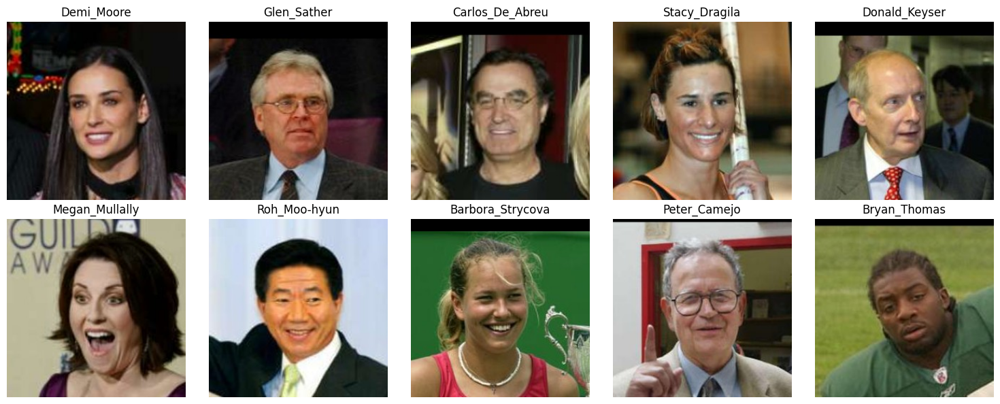

In [3]:
extract_path = "/home/cminds/CMInDS/Uddeshya/lfw"
print_content(extract_path)

In [5]:
# Define the directory and desired size
data_dir = "/home/cminds/CMInDS/Uddeshya/my_data/my"
desired_size = (224, 224)

# Walk through directory
for dirpath, dirnames, filenames in os.walk(data_dir):
    for filename in filenames:
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):  # assuming these are your image formats
            img_path = os.path.join(dirpath, filename)
            img = Image.open(img_path)
            img_resized = img.resize(desired_size, 3)  # Using 3 instead of Image.ANTIALIAS
            img_resized.save(img_path)
            #print(f"Resized {img_path} to {desired_size}")

print("Resizing complete!")

Resizing complete!


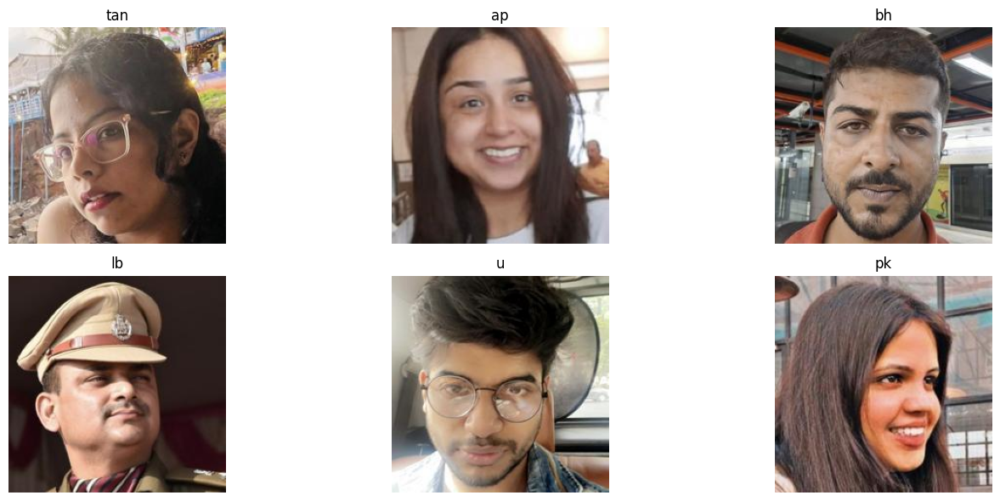

In [3]:
extract_path1 = "/home/cminds/CMInDS/Uddeshya/my_data/my"

print_content(extract_path1)

### 2. Get the number of persons who have more than one image

- Dataset Analysis
  - The analyze_lfw_dataset function inspects the LFW (Labeled Faces in the Wild) dataset directory structure to determine the total count of unique individuals and the number of individuals who have more than one associated image. It takes the root directory of the LFW dataset as its parameter and returns the count of persons with multiple images and the total number of unique individuals, while also displaying these statistics.

In [6]:
def analyze_lfw_dataset(extract_path):
    people = os.listdir(extract_path)
    multiple_images_count = sum(1 for person in people if len(os.listdir(os.path.join(extract_path, person))) > 1) # Count the number of persons with more than one image
    print(f"Total number of persons in the dataset: {len(people)}")
    print(f"Number of persons with more than one image: {multiple_images_count}")
    return multiple_images_count, len(people)

analyze_lfw_dataset(extract_path)

Total number of persons in the dataset: 5749
Number of persons with more than one image: 1680


(1680, 5749)

In [33]:
analyze_lfw_dataset(extract_path1)

Total number of persons in the dataset: 6
Number of persons with more than one image: 3


(3, 6)

In [5]:
lfw_contents = os.listdir(extract_path) # Count the number of subdirectories and the distribution of the number of images per individual
num_subdirectories = len(lfw_contents)
images_per_individual = [len(os.listdir(os.path.join(extract_path, subdir))) for subdir in lfw_contents]
average_images_per_individual = sum(images_per_individual) / num_subdirectories  # Calculate some statistics
max_images_per_individual = max(images_per_individual)
min_images_per_individual = min(images_per_individual)

num_subdirectories, average_images_per_individual, max_images_per_individual, min_images_per_individual

(5749, 2.301791615933206, 530, 1)

### 3. Split into training, validation, and testing by person (not by image)

- First, I create the necessary directory structure for the split dataset. This structure includes three main directories: 'train,' 'val' (validation), and 'test' (testing). 
- If these directories already exist, the function prints a message indicating that the data split has already been performed and exits to avoid redoing the split unnecessarily. 
- Otherwise, it proceeds to create these directories for organizing the dataset into training, validation, and testing subsets.
- It then categorizes individuals into two groups based on whether they have a single image or multiple images. 
- The desired train, validation, and test ratios are then applied to each group separately. Specifically, the function determines the number of single-image and multiple-image individuals for each split using the provided ratios.

### - Important to take care of distribution of data and hence domain shift across sets

In [7]:
def split_lfw_dataset(lfw_dir, output_dir, train_ratio=0.7, val_ratio=0.15):
    train_dir = os.path.join(output_dir, 'train')  # Ensure output directories exist
    val_dir = os.path.join(output_dir, 'val')
    test_dir = os.path.join(output_dir, 'test')

    if os.path.exists(train_dir) and os.path.exists(val_dir) and os.path.exists(test_dir):
        print("Data has already been split!")  ## to ensure never to redo the split
        return
    
    for d in [train_dir, val_dir, test_dir]:
        if not os.path.exists(d):
            os.makedirs(d)

    people = os.listdir(lfw_dir)  # Separate people into those with single and multiple images
    single_image_people = [person for person in people if len(os.listdir(os.path.join(lfw_dir, person))) == 1]
    multi_image_people = [person for person in people if len(os.listdir(os.path.join(lfw_dir, person))) > 1]

    train_size_single = int(len(single_image_people) * train_ratio) # Split the lists , a ratio is maintained
    val_size_single = int(len(single_image_people) * val_ratio)

    train_size_multi = int(len(multi_image_people) * train_ratio)
    val_size_multi = int(len(multi_image_people) * val_ratio)

    train_people = single_image_people[:train_size_single] + multi_image_people[:train_size_multi]
    val_people = single_image_people[train_size_single:train_size_single+val_size_single] + multi_image_people[train_size_multi:train_size_multi+val_size_multi]
    test_people = single_image_people[train_size_single+val_size_single:] + multi_image_people[train_size_multi+val_size_multi:]

    for person in train_people: # Copy images to the new directories
        shutil.copytree(os.path.join(lfw_dir, person), os.path.join(train_dir, person)) 
    for person in val_people:
        shutil.copytree(os.path.join(lfw_dir, person), os.path.join(val_dir, person))    
    for person in test_people:
        shutil.copytree(os.path.join(lfw_dir, person), os.path.join(test_dir, person))

    print("Dataset split completed!")

In [8]:
# Example usage:
output_directory = "/home/cminds/CMInDS/Uddeshya/lwf_split_0.7"
split_lfw_dataset(extract_path, output_directory)

Data has already been split!


- Analysing the splitted Datasets  

    - Train Data Set 

In [9]:
train_path = "/home/cminds/CMInDS/Uddeshya/lwf_split_0.7/train"
validation_path = "/home/cminds/CMInDS/Uddeshya/lwf_split_0.7/val"
test_path = "/home/cminds/CMInDS/Uddeshya/lwf_split_0.7/test"
analyze_lfw_dataset(train_path)


Total number of persons in the dataset: 4024
Number of persons with more than one image: 1176


(1176, 4024)

    - Valid Data Set 

In [10]:
analyze_lfw_dataset(validation_path)


Total number of persons in the dataset: 862
Number of persons with more than one image: 252


(252, 862)

    - Test Data Set 

In [11]:
analyze_lfw_dataset(test_path)

Total number of persons in the dataset: 863
Number of persons with more than one image: 252


(252, 863)

### 5. Appropriately crop and resize the images based on your computational resources

- #### DATA PREPROCESSING AND CROPPING

- This function is designed to preprocess a set of images, optionally resizing and cropping them, and saving the results in an organized directory structure. 
- It also performs checks to skip preprocessing for directories that already exist, ensuring efficiency and avoiding duplication.

In [29]:
def preprocess_and_save_images(input_dir, output_dir, set_name, custom_size=None, crop=False , crop_size = (224, 224)):
    set_output_dir = os.path.join(output_dir, set_name) # Define the output directory for this set                                                              
    if os.path.exists(set_output_dir):     # Check if the output directory already exists             
        print(f"Output directory '{set_output_dir}' already exists. Skipping preprocessing.")
        return
    
    os.makedirs(set_output_dir, exist_ok=True)
    transform_list = [
        transforms.Resize(custom_size) if custom_size is not None else transforms.Resize((250, 250)),
        transforms.CenterCrop(crop_size) if crop and custom_size is not None else transforms.Resize(custom_size),
        transforms.ToTensor(),
        
    ]# Define the transformations

    transform = transforms.Compose(transform_list)
    for person in os.listdir(input_dir):                 # Iterate through the images in the input directory
        person_dir = os.path.join(input_dir, person)
        output_person_dir = os.path.join(set_output_dir, person)
        
        if os.path.exists(output_person_dir):
            print(f"Output directory '{output_person_dir}' for '{person}' already exists. Skipping preprocessing.")
            continue
        
        os.makedirs(output_person_dir, exist_ok=True)

        for image_name in os.listdir(person_dir):
            
            input_image_path = os.path.join(person_dir, image_name)
            output_image_path = os.path.join(output_person_dir, image_name)
            image = Image.open(input_image_path)
            image = transform(image)
            image = transforms.ToPILImage()(image) # Convert the tensor back to a PIL image and save
            image.save(output_image_path)

In [34]:
input_dir = "/home/cminds/CMInDS/Uddeshya/my_data"
output_dir = "/home/cminds/CMInDS/Uddeshya/mydata_0.7"
preprocess_and_save_images(os.path.join(input_dir, "my"), output_dir, "myprocessed_0.7", custom_size=(224, 224), crop=True )

In [13]:
input_dir = "/home/cminds/CMInDS/Uddeshya/lwf_split_0.7"
output_dir = "/home/cminds/CMInDS/Uddeshya/lwf_processed_cropped2_0.7"
preprocess_and_save_images(os.path.join(input_dir, "train"), output_dir, "train_processed_cropped2_0.7", custom_size=(224, 224), crop=True )
preprocess_and_save_images(os.path.join(input_dir, "val"), output_dir, "val_processed_cropped2_0.7", custom_size=(224, 224), crop=True)
preprocess_and_save_images(os.path.join(input_dir, "test"), output_dir, "test_processed_cropped2_0.7", custom_size=(224, 224), crop=True)

Output directory '/home/cminds/CMInDS/Uddeshya/lwf_processed_cropped2_0.7/train_processed_cropped2_0.7' already exists. Skipping preprocessing.
Output directory '/home/cminds/CMInDS/Uddeshya/lwf_processed_cropped2_0.7/val_processed_cropped2_0.7' already exists. Skipping preprocessing.
Output directory '/home/cminds/CMInDS/Uddeshya/lwf_processed_cropped2_0.7/test_processed_cropped2_0.7' already exists. Skipping preprocessing.


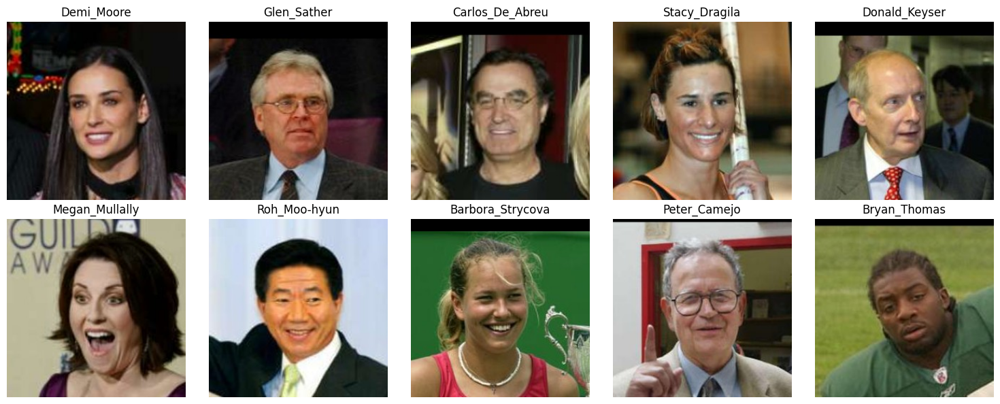

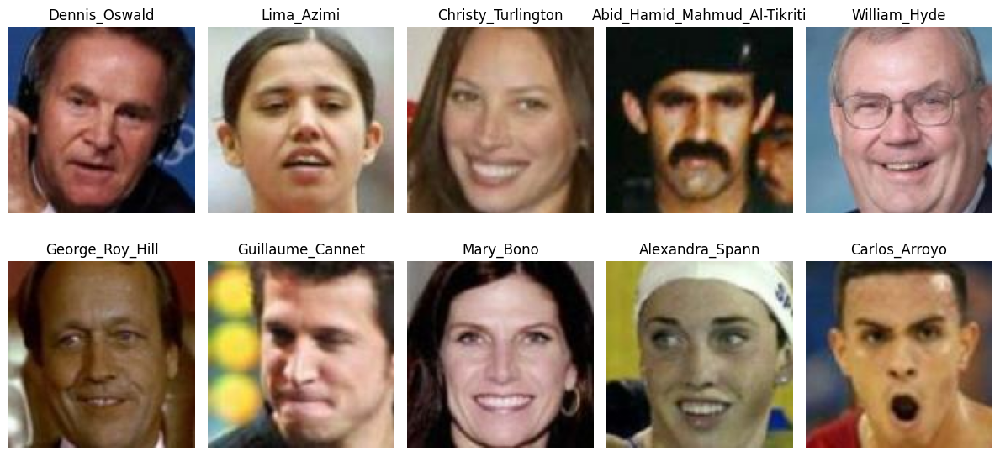

In [14]:
def print_images(dir):
    people_dirs = [d for d in os.listdir(dir) if os.path.isdir(os.path.join(dir, d))]
    selected_people = random.sample(people_dirs, 10) # randomly select 10 people
    plt.figure(figsize=(12, 6))
    for i, person in enumerate(selected_people, 1):
        person_dir = os.path.join(dir, person)
        image_files = os.listdir(person_dir)
        selected_image_file = random.choice(image_files)  # Randomly select an image for each person
        image_path = os.path.join(person_dir, selected_image_file)
        
        # Load and display the image
        image = Image.open(image_path)                                       
        plt.subplot(2, 5, i)
        plt.imshow(image)
        plt.title(person)
        plt.axis('off')

    plt.tight_layout()
    plt.show()
train_dir = "lwf_processed_cropped2_0.7/train_processed_cropped2_0.7"
print_content(extract_path)
print_images(train_dir)    

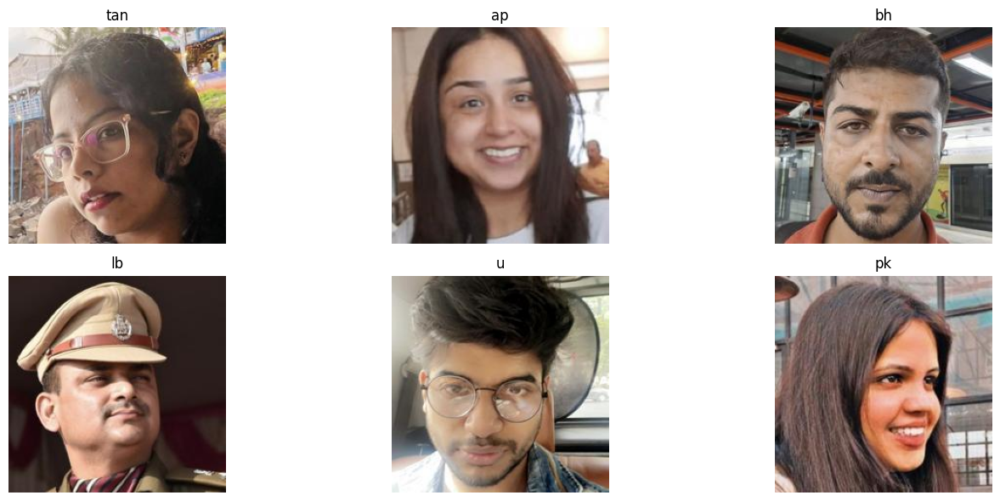

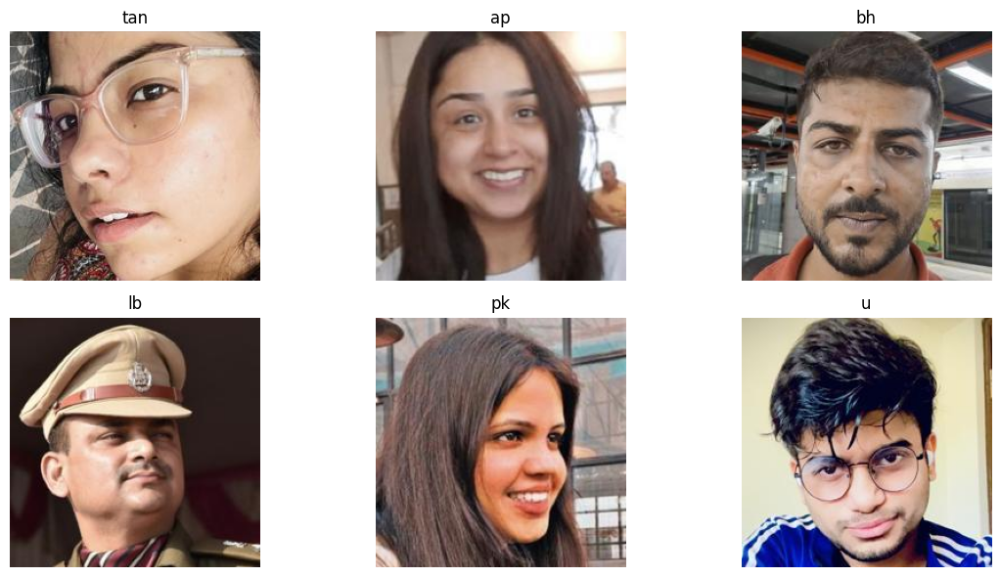

In [37]:
def print_images(dir):
    people_dirs = [d for d in os.listdir(dir) if os.path.isdir(os.path.join(dir, d))]
    selected_people = random.sample(people_dirs, 6) # randomly select 10 people
    plt.figure(figsize=(12, 6))
    for i, person in enumerate(selected_people, 1):
        person_dir = os.path.join(dir, person)
        image_files = os.listdir(person_dir)
        selected_image_file = random.choice(image_files)  # Randomly select an image for each person
        image_path = os.path.join(person_dir, selected_image_file)
        
        # Load and display the image
        image = Image.open(image_path)                                       
        plt.subplot(2, 3, i)
        plt.imshow(image)
        plt.title(person)
        plt.axis('off')

    plt.tight_layout()
    plt.show()
train_dir = "/home/cminds/CMInDS/Uddeshya/mydata_0.7/myprocessed_0.7"
print_content(extract_path1)
print_images(train_dir)   

- ### DATA AUGMENTATION
        - ALBUMENTATION  

- This function is designed to perform data augmentation on a set of input images, saving both the augmented and original images in an organized directory structure
- The function defines a set of data augmentation transformations using the Albumentations library. 
- These transformations include horizontal flipping, color jitter, rotation, random resized crop, and shift-scale-rotate.


In [15]:
def augment_and_save_images2(input_dir, output_dir, num_augmented_images_per_original, display_comparison=False):
    if os.path.exists(output_dir):
        print(f"Output directory '{output_dir}' already exists. Skipping preprocessing.")
        return

    os.makedirs(output_dir, exist_ok=True)
    original_images_dir = os.path.join(output_dir, "original")
    os.makedirs(original_images_dir, exist_ok=True)

    # Define data augmentation transformations using albumentations
    transform = A.Compose([
        A.HorizontalFlip(p=0.5), # horizontal flip with the prob of 0.5
        A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=1), # brightness settings
        A.Rotate(limit=10, p=1), # rotation woth prob 1
        A.RandomResizedCrop(224, 224, scale=(0.8, 1.0), p=1), #resizing
        A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.0, rotate_limit=0, p=1),
        ToTensorV2()
    ])

    displayed_indices = []

    for person in os.listdir(input_dir): # Loop through each person's directory in the input directory
        person_dir = os.path.join(input_dir, person)
        output_person_dir = os.path.join(output_dir, person)
        os.makedirs(output_person_dir, exist_ok=True)

        for image_name in os.listdir(person_dir): # Loop through each image in the person's directory
            input_image_path = os.path.join(person_dir, image_name)
            original_image = Image.open(input_image_path)
            original_image_path = os.path.join(original_images_dir, f"{person}_{image_name}")
            original_image.save(original_image_path)

            if len(displayed_indices) < 5: # Display original and augmented images for the first 5 images
                plt.figure(figsize=(12, 6))
                plt.subplot(2, num_augmented_images_per_original + 1, 1)
                plt.imshow(original_image)
                plt.title("Original")
                plt.axis('off')

            for i in range(num_augmented_images_per_original):  # Apply data augmentation and save augmented images
                augmented = transform(image=np.array(original_image))
                augmented_image = augmented["image"]
                augmented_image_name = f"{i}_{image_name}"
                augmented_image_path = os.path.join(output_person_dir, augmented_image_name)
                augmented_image_pil = transforms.ToPILImage()(augmented_image)
                augmented_image_pil.save(augmented_image_path)

                if len(displayed_indices) < 5:
                    plt.subplot(2, num_augmented_images_per_original + 1, i + 2)
                    plt.imshow(augmented_image_pil)
                    plt.title(f"Augmented {i + 1}")
                    plt.axis('off')

            if len(displayed_indices) < 5:
                plt.tight_layout()
                plt.show()
                displayed_indices.append(len(displayed_indices))

    if display_comparison:
        print("Displaying original and augmented images for comparison.")

Refrence: https://www.youtube.com/results?search_query=zero+to+gan

In [16]:
input_dir = "/home/cminds/CMInDS/Uddeshya/lwf_processed_cropped2_0.7/train_processed_cropped2_0.7"
output_dir = "/home/cminds/CMInDS/Uddeshya/lwf_augmented/train_augmented_album_0.7"
num_augmented_images_per_original = 3
augment_and_save_images2(input_dir, output_dir, num_augmented_images_per_original , display_comparison=True)

Output directory '/home/cminds/CMInDS/Uddeshya/lwf_augmented/train_augmented_album_0.7' already exists. Skipping preprocessing.


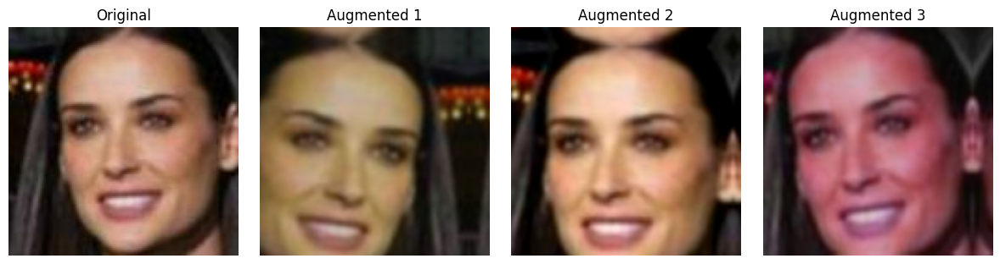

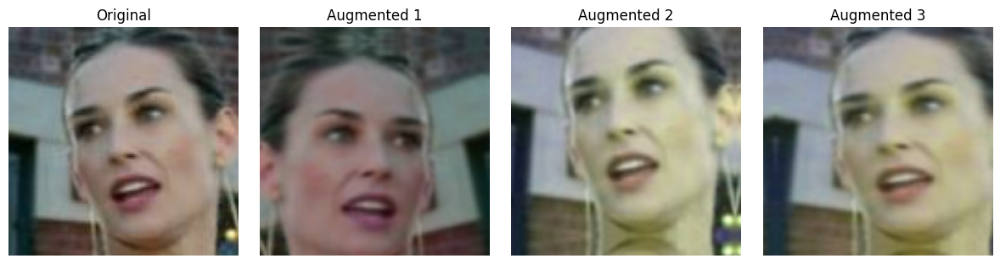

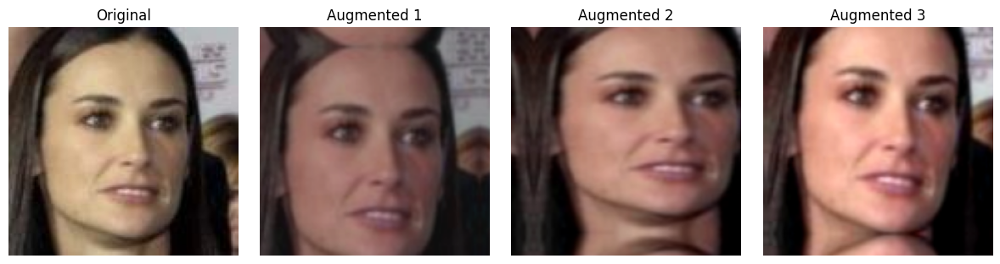

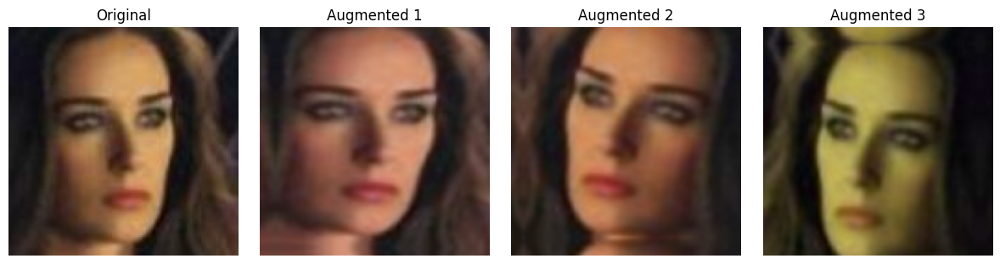

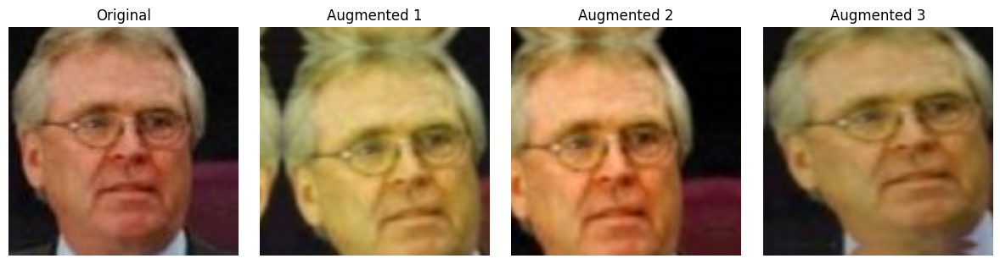

Displaying original and augmented images for comparison.


In [27]:
input_dir = "/home/cminds/CMInDS/Uddeshya/lwf_processed_cropped2_0.7/train_processed_cropped2_0.7"
output_dir = "/home/cminds/CMInDS/Uddeshya/lwf_augmented/train_augmented_album_0.7_1"
num_augmented_images_per_original = 3
augment_and_save_images2(input_dir, output_dir, num_augmented_images_per_original , display_comparison=True)

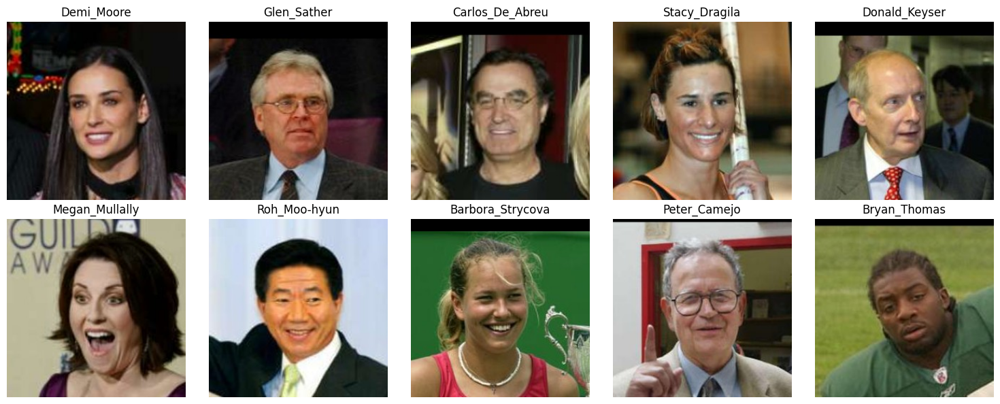

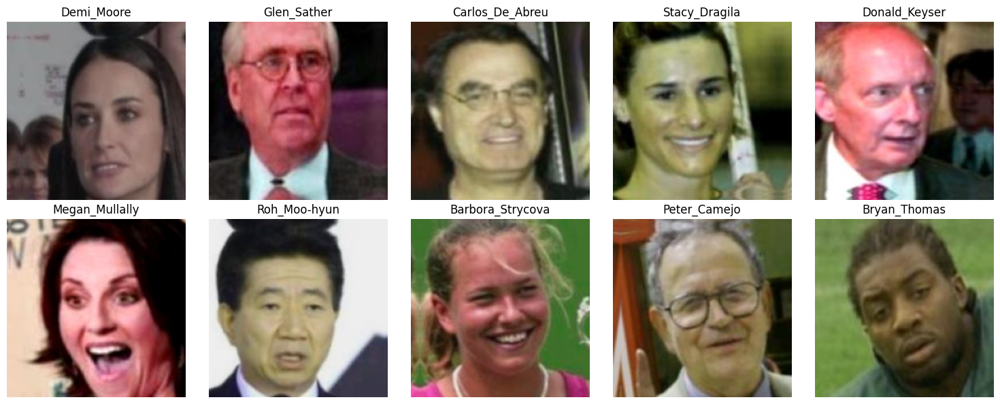

In [17]:
extract_path2 = "/home/cminds/CMInDS/Uddeshya/lwf_augmented/train_augmented_album"
print_content(extract_path)
print_content(extract_path2)

### DATASET and DATAloader

    - Creating Dictionary
-  This function takes a directory of images, resizes them to a standard size of 224x224 pixels, converts them into tensors, and organizes them into a dictionary where each person's images are represented as a tensor. 

In [38]:
def images_to_tensors_dict(directory):
    transform = transforms.Compose([        # Create a transform to convert images into tensors
        transforms.Resize((224, 224)),  # Resize images to 224x224 (commonly used size for neural networks)
        transforms.ToTensor()           # Convert the PIL Image to a tensor
    ])
    tensors_dict = {}
    for person in os.listdir(directory):
        person_dir = os.path.join(directory, person)
        
        person_tensors = []
        for image_name in os.listdir(person_dir):
            image_path = os.path.join(person_dir, image_name) # load image
            image = Image.open(image_path).convert('RGB')  # Ensure images are RGB
            tensor_image = transform(image)
            person_tensors.append(tensor_image)
        tensors_dict[person] = torch.stack(person_tensors, dim=0)
    
    return tensors_dict

- Train Dictionary 
        - For the augmented set

In [35]:
train_directory = "/home/cminds/CMInDS/Uddeshya/train_augmented_plus_original" 
train_dict = images_to_tensors_dict(train_directory)

count = 0
for person, tensors in train_dict.items():
    print(f"{person}: {tensors.shape}")
    count+=1
    if count == 5:
        break


Demi_Moore: torch.Size([16, 3, 224, 224])
Glen_Sather: torch.Size([4, 3, 224, 224])
Carlos_De_Abreu: torch.Size([4, 3, 224, 224])
Stacy_Dragila: torch.Size([8, 3, 224, 224])
Donald_Keyser: torch.Size([4, 3, 224, 224])


- Train DIctionary-  for the ordinal unaugmented set

In [36]:
train_directory1 = "/home/cminds/CMInDS/Uddeshya/lwf_processed_cropped2/val_processed_cropped2" 
train_dict1 = images_to_tensors_dict(train_directory1)

count = 0
for person, tensors in train_dict1.items():
    print(f"{person}: {tensors.shape}")
    count+=1
    if count == 5:
        break


Barrett_Jackman: torch.Size([2, 3, 224, 224])
Sheila_Copps: torch.Size([4, 3, 224, 224])
Goh_Kun: torch.Size([2, 3, 224, 224])
Martin_Brodeur: torch.Size([2, 3, 224, 224])
Brad_Russ: torch.Size([1, 3, 224, 224])


-  Validation Dictionary

In [4]:
valid_directory = "/home/cminds/CMInDS/Uddeshya/lwf_processed_cropped2/val_processed_cropped2" 
valid_dict = images_to_tensors_dict(valid_directory)

for person, tensors in valid_dict.items():
    print(f"{person}: {tensors.shape}")
    break

Barrett_Jackman: torch.Size([2, 3, 224, 224])


- Test Dictionary

In [5]:
test_directory = "/home/cminds/CMInDS/Uddeshya/lwf_processed_cropped2/test_processed_cropped2" 
test_dict = images_to_tensors_dict(test_directory)

for person, tensors in test_dict.items():
    print(f"{person}: {tensors.shape}")
    break

Eddie_Sutton: torch.Size([2, 3, 224, 224])


In [39]:
train_directory1 = "/home/cminds/CMInDS/Uddeshya/mydata_0.7/myprocessed_0.7" 
train_dict1 = images_to_tensors_dict(train_directory1)

count = 0
for person, tensors in train_dict1.items():
    print(f"{person}: {tensors.shape}")
    count+=1
    if count == 5:
        break

tan: torch.Size([3, 3, 224, 224])
ap: torch.Size([1, 3, 224, 224])
bh: torch.Size([2, 3, 224, 224])
lb: torch.Size([1, 3, 224, 224])
u: torch.Size([3, 3, 224, 224])


#### - DATASET 
        - Positive and Negative Pair
 - This function generates pairs of tensors representing both positive and negative pairs for a Siamese network. 
 - Positive pairs consist of two tensors from the same person, while negative pairs contain tensors from different individuals. 
 - It filters out individuals who have only one image since creating pairs from a single image is not possible.
 - The function enters a loop to create positive and corresponding negative pairs until the desired number of pairs is reached. 
 - It randomly selects a person and then two tensors from that person's set of images for the positive pair. 
 - For the negative pair, it randomly selects another person and one tensor from that person's images, ensuring the pairs are negative  
 - After generating positive and negative pairs, the function combines them into a single list and shuffles the order. 
 - Finally, it converts these pairs into PyTorch tensors, including the two sets of images (images1 and images2) and their corresponding labels (labels). Additionally, it returns the counts of positive and negative pairs generated.

In [40]:
import random
import torch

def create_pairs(tensor_images_dict, num_pairs):
    positive_pairs = []
    negative_pairs = []
    eligible_persons = [k for k, v in tensor_images_dict.items() if len(v) > 1] # Filter out persons with more than one image
    while len(positive_pairs) < num_pairs:
        person = random.choice(eligible_persons)
        tensors = tensor_images_dict[person]
        tensor1, tensor2 = random.sample(list(tensors), 2) # positive pair
        positive_pairs.append((tensor1, tensor2, torch.tensor(1)))
        other_persons = [p for p in tensor_images_dict.keys() if p != person] # Corresponding negative pair for tensor1
        other_person = random.choice(other_persons)
        tensor3 = random.choice(tensor_images_dict[other_person])
        negative_pairs.append((tensor1, tensor3, torch.tensor(0)))

        if len(positive_pairs) >= num_pairs:
            break
    all_pairs = positive_pairs + negative_pairs  # Combine and shuffle
    random.shuffle(all_pairs)
    images1 = torch.stack([img1 for img1, _, _ in all_pairs]) # Convert to tensors
    images2 = torch.stack([img2 for _, img2, _ in all_pairs])
    labels = torch.stack([label for _, _, label in all_pairs])

    return images1, images2, labels, len(positive_pairs), len(negative_pairs)

Reference [2] , [3]

In [41]:
train_images1, train_images2, train_labels, len1 , len2  = create_pairs(train_dict, num_pairs=12000)
print(f"images1 shape: {train_images1.shape}")
print(f"images2 shape: {train_images2.shape}")
print(f"labels shape: {train_labels.shape}")

images1 shape: torch.Size([24000, 3, 224, 224])
images2 shape: torch.Size([24000, 3, 224, 224])
labels shape: torch.Size([24000])


In [42]:
train_images, train_images, train_label, len1 , len2  = create_pairs(train_dict1, num_pairs=1000)
print(f"images1 shape: {train_images.shape}")
print(f"images2 shape: {train_images.shape}")
print(f"labels shape: {train_label.shape}")

images1 shape: torch.Size([2000, 3, 224, 224])
images2 shape: torch.Size([2000, 3, 224, 224])
labels shape: torch.Size([2000])


In [7]:
valid_images1, valid_images2, valid_labels, len1 , len2  = create_pairs(valid_dict, num_pairs=300)
print(f"images1 shape: {valid_images1.shape}")
print(f"images2 shape: {valid_images2.shape}")
print(f"labels shape: {valid_labels.shape}")

images1 shape: torch.Size([600, 3, 224, 224])
images2 shape: torch.Size([600, 3, 224, 224])
labels shape: torch.Size([600])


In [8]:
test_images1, test_images2, test_labels, len1 , len2  = create_pairs(test_dict, num_pairs=300)
print(f"images1 shape: {test_images1.shape}")
print(f"images2 shape: {test_images2.shape}")
print(f"labels shape: {test_labels.shape}")

images1 shape: torch.Size([600, 3, 224, 224])
images2 shape: torch.Size([600, 3, 224, 224])
labels shape: torch.Size([600])


In [67]:
train_images1, train_images2, train_labels, len1 , len2  = create_pairs(train_dict1, num_pairs=5)
print(f"images1 shape: {train_images.shape}")
print(f"images2 shape: {train_images.shape}")
print(f"labels shape: {train_label.shape}")

images1 shape: torch.Size([10, 3, 224, 224])
images2 shape: torch.Size([10, 3, 224, 224])
labels shape: torch.Size([10])


In [46]:
import gc
del train_dict1
gc.collect()

0

In [49]:
def visualize_pairs(images1, images2, labels, num_samples=5):
    fig = plt.figure(figsize=(15, 5 * num_samples))
    for i in range(num_samples):
        plt.subplot(num_samples, 2, 2*i+1)
        plt.imshow(images1[i].permute(1, 2, 0))
        plt.title(f"Image 1 - Label: {labels[i].item()}")
        plt.axis('off')
        plt.subplot(num_samples, 2, 2*i+2)
        plt.imshow(images2[i].permute(1, 2, 0))
        plt.title(f"Image 2 - Label: {labels[i].item()}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

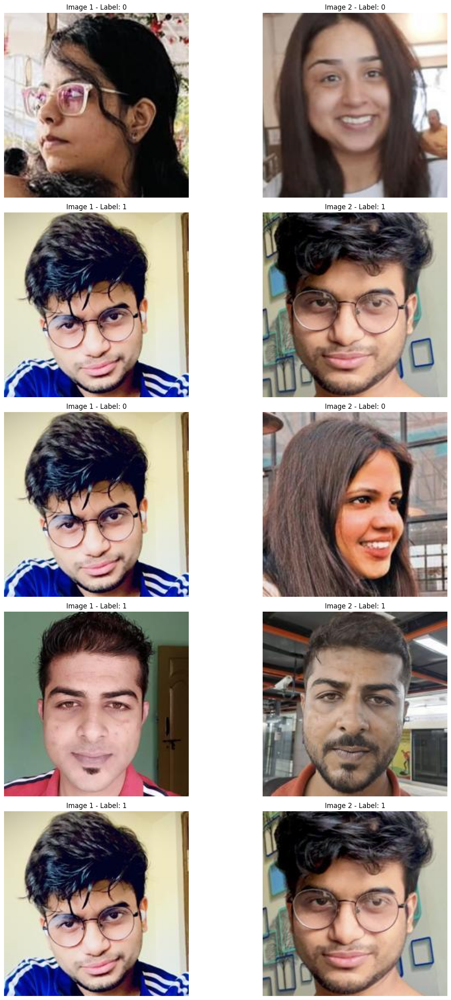

In [68]:
visualize_pairs(train_images1, train_images2, train_labels)

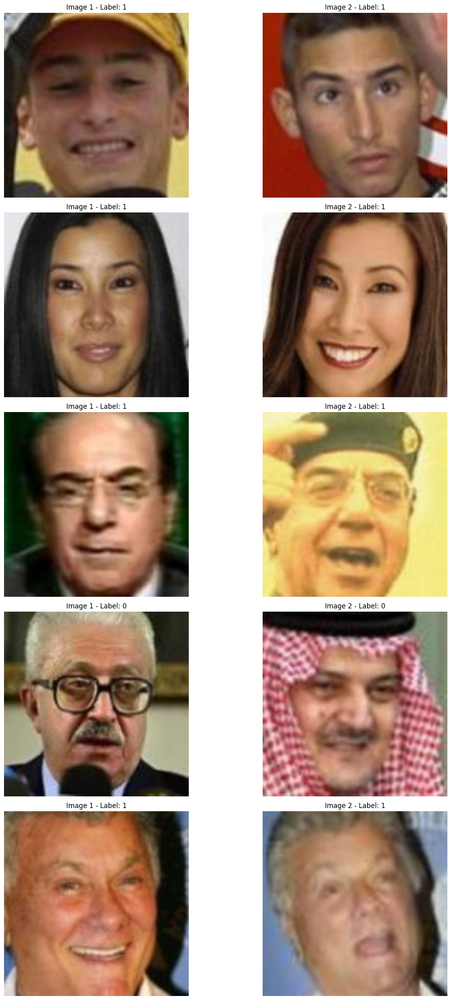

In [ ]:
visualize_pairs(valid_images1, valid_images2, valid_labels)

            - Pytorch Dataset

- This SiameseDataset class is designed to represent a dataset for training a Siamese neural network (inherets nn.module)
- It takes pairs of images (images1 and images2) and their corresponding labels (positive = 1 , Negative = 0)  as input and applies resizing and normalization transformations to the images. 
- The class provides methods to access the length of the dataset and retrieve individual samples (image pairs and labels) during training.

In [51]:
class SiameseDataset(Dataset):
    def __init__(self, images1, images2, labels):
        self.images1 = images1
        self.images2 = images2
        self.labels = labels
        self.transform = transforms.Compose([
            transforms.Resize((224, 224)),  # Resize to the size expected by ViT
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize using ImageNet norms
        ])

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        img1 = self.transform(self.images1[idx])
        img2 = self.transform(self.images2[idx])
        label = self.labels[idx]
        return img1, img2, label

Reference [1] , [2]

In [48]:
batch_size = 16

In [49]:
train_dataset = SiameseDataset(train_images1, train_images2, train_labels)
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=16)

In [23]:
train_dataset1 = SiameseDataset(train_images, train_images, train_label)
train_dataloader1 = DataLoader(train_dataset1, batch_size=batch_size, shuffle=True, num_workers=16)

In [17]:
valid_dataset = SiameseDataset(valid_images1, valid_images2, valid_labels)
valid_dataloader = DataLoader(valid_dataset, batch_size=4, shuffle=False, num_workers=1)

In [18]:
test_dataset = SiameseDataset(test_images1, test_images2, test_labels)
test_dataloader = DataLoader(test_dataset, batch_size=4, shuffle=False, num_workers=1)

In [69]:
train_dataset = SiameseDataset(train_images1, train_images2, train_labels)
train_dataloader = DataLoader(train_dataset, batch_size=2, shuffle=False, num_workers=1)

In [53]:
def inverse_normalize(tensor, mean, std):
    """Inverse Normalize a tensor"""
    for t, m, s in zip(tensor, mean, std):
        t.mul_(s).add_(m)
    return tensor

def visualize_samples(dataloader, num_samples=3):
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]
    batch_images1, batch_images2, batch_labels = next(iter(dataloader)) # Get a single batch from the dataloader
    fig, axs = plt.subplots(num_samples, 2, figsize=(10, 4 * num_samples))

    for i in range(num_samples):
        img1 = inverse_normalize(batch_images1[i].clone().detach(), mean, std)
        img2 = inverse_normalize(batch_images2[i].clone().detach(), mean, std)

        axs[i, 0].imshow(TF.to_pil_image(img1))
        axs[i, 1].imshow(TF.to_pil_image(img2))
        axs[i, 0].set_title(f"Label: {batch_labels[i].item()}")
        axs[i, 1].set_title(f"Label: {batch_labels[i].item()}")
        axs[i, 0].axis('off')
        axs[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

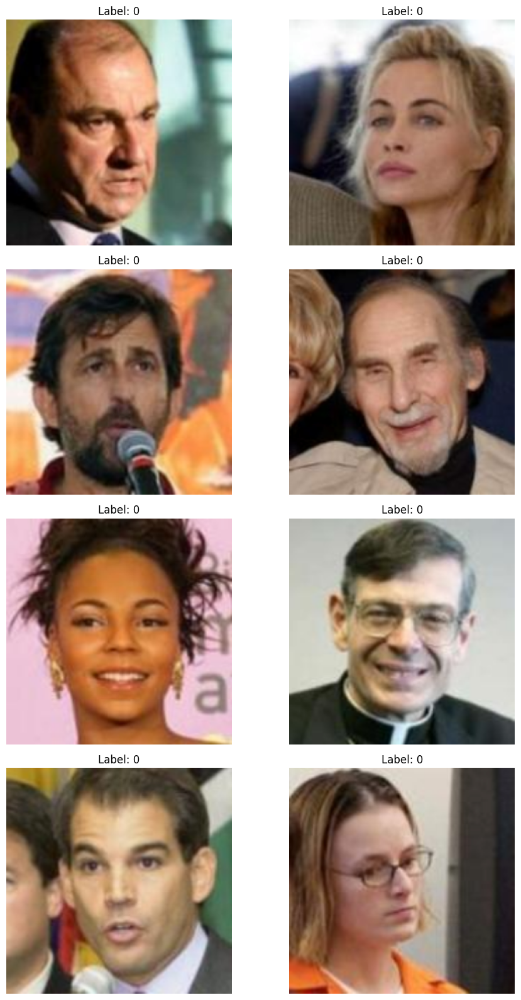

In [32]:
# Visualize the samples
visualize_samples(valid_dataloader , num_samples=4)

### 4. Start with a network that is pre-trained on ImageNet and appropriate for your computational resources

### - Model Used:
    - EfficientNet B0
    - ResNet - 18
    - ResNet - 34

### - Efficient Net 
- The class uses the EfficientNet backbone, unfreezing a specified number of layers, flattening the output, adding a custom embedding layer, and applying dropout to create embeddings for input pairs. The forward method computes embeddings for two input images, and the forward_one method is used to compute embeddings for a single input image.

In [55]:
class SiameseEfficientNetWithCustomEmbedding(nn.Module):
    def __init__(self, custom_embedding_dim, efficientnet_version="efficientnet_b0", 
                 unfreeze_layers=0, dropout_rate=0.5):  #Add dropout_rate parameter
        super(SiameseEfficientNetWithCustomEmbedding, self).__init__()
        self.efficientnet = timm.create_model(efficientnet_version, pretrained=True) # Load pre-trained EfficientNet
        
        for param in self.efficientnet.parameters(): # Freeze all layers first
            param.requires_grad = False        
        
        if unfreeze_layers > 0: # Unfreeze the last 'unfreeze_layers' layers
            num_unfrozen = 0
            for stage in reversed(self.efficientnet.blocks):  # Start from the last stage
                for block in reversed(stage):  # Start from the last block
                    for param in block.parameters():
                        param.requires_grad = True
                        num_unfrozen += 1
                        if num_unfrozen == unfreeze_layers:
                            break
                    if num_unfrozen == unfreeze_layers:
                        break
                if num_unfrozen == unfreeze_layers:
                    break 
        self.features = nn.Sequential(*list(self.efficientnet.children())[:-1]) # Remove classifier
        feature_dim = self.efficientnet.classifier.in_features # Get infeature dimension for the final classifier of the EfficientNet version
        self.flatten = nn.Flatten() # Flatten the output
        self.custom_embedding_layer = nn.Linear(feature_dim, custom_embedding_dim) # Add an additional learnable layer with custom_embedding_dim
        self.dropout = nn.Dropout(p=dropout_rate) 

    def forward_one(self, x): # modifying the forward function
        x = self.features(x)
        x = self.flatten(x)
        x = self.dropout(x)  
        x = self.custom_embedding_layer(x)
        return x

    def forward(self, input1, input2): # Get embeddings for each input
        output1 = self.forward_one(input1)
        output2 = self.forward_one(input2)
        return output1, output2

Reference : [2] , https://www.youtube.com/watch?v=V_xro1bcAuA

In [55]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelW = SiameseEfficientNetWithCustomEmbedding(custom_embedding_dim=512, efficientnet_version="efficientnet_b0", unfreeze_layers=6 , dropout_rate = 0.2).to(device)

In [29]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelY = SiameseEfficientNetWithCustomEmbedding(custom_embedding_dim=512, efficientnet_version="efficientnet_b0", unfreeze_layers=2).to(device)

In [46]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelZ = SiameseEfficientNetWithCustomEmbedding(custom_embedding_dim=512, efficientnet_version="efficientnet_b0", unfreeze_layers=2).to(device)

In [54]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelW = SiameseEfficientNetWithCustomEmbedding(custom_embedding_dim=512, efficientnet_version="efficientnet_b0", unfreeze_layers=6).to(device)

In [ ]:
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# modelZ = SiameseEfficientNetWithCustomEmbedding(custom_embedding_dim=512, efficientnet_version="efficientnet_b0", unfreeze_layers=2).to(device)

### Resnet - 34

In [30]:
class SiameseResNet34WithCustomEmbedding(nn.Module):
    def __init__(self, custom_embedding_dim, unfreeze_layers=0):
        super(SiameseResNet34WithCustomEmbedding, self).__init__()
        
        self.resnet34 = resnet34(weights=ResNet34_Weights.IMAGENET1K_V1)
        self.embedding = nn.Sequential(*list(self.resnet34.children())[:-1])
        self.flatten = nn.Flatten()
        self.custom_embedding_layer = nn.Linear(512, custom_embedding_dim)
        for param in self.resnet34.parameters():
            param.requires_grad = False
        if unfreeze_layers > 0:
            children_list = list(self.resnet34.children()) 
            reversed_children = reversed(children_list)
            
            num_unfrozen = 0
            for child in reversed_children:
                for param in child.parameters():
                    param.requires_grad = True
                    num_unfrozen += 1
                    if num_unfrozen == unfreeze_layers:
                        break
                if num_unfrozen == unfreeze_layers:
                    break

    def forward_one(self, x):
        x = self.embedding(x)
        x = self.flatten(x)
        x = self.custom_embedding_layer(x)
        return x

    def forward(self, input1, input2):
        output1 = self.forward_one(input1)
        output2 = self.forward_one(input2)
        return output1, output2

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelR34 = SiameseResNet34WithCustomEmbedding(custom_embedding_dim=256 , unfreeze_layers=2).to(device)

### Resnet - 18

In [56]:
from torchvision.models import resnet18
from torchvision.models.resnet import ResNet18_Weights

class SiameseResNetWithCustomEmbedding(nn.Module):
    def __init__(self, custom_embedding_dim, unfreeze_layers=0):
        super(SiameseResNetWithCustomEmbedding, self).__init__()
        self.resnet18 = resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
        self.embedding = nn.Sequential(*list(self.resnet18.children())[:-1])
        self.flatten = nn.Flatten()
        self.custom_embedding_layer = nn.Linear(512, custom_embedding_dim)
        for param in self.resnet18.parameters():
            param.requires_grad = False
        if unfreeze_layers > 0:
            children_list = list(self.resnet18.children())  
            reversed_children = reversed(children_list)
            
            num_unfrozen = 0
            for child in reversed_children:
                for param in child.parameters():
                    param.requires_grad = True
                    num_unfrozen += 1
                    if num_unfrozen == unfreeze_layers:
                        break
                if num_unfrozen == unfreeze_layers:
                    break

    def forward_one(self, x):
        x = self.embedding(x)
        x = self.flatten(x)
        x = self.custom_embedding_layer(x)
        return x

    def forward(self, input1, input2):
        output1 = self.forward_one(input1)
        output2 = self.forward_one(input2)
        return output1, output2

In [75]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelR = SiameseResNetWithCustomEmbedding(custom_embedding_dim=512 , unfreeze_layers=4).to(device)

In [30]:
def trainable_parameters_summary(model):
    print("Trainable layers:")
    total_params = 0
    for name, param in model.named_parameters():
        if param.requires_grad:
            num_params = param.numel()
            total_params += num_params
            print(f"{name}, shape: {list(param.shape)}, parameters: {num_params}")
    print(f"\nTotal trainable parameters: {total_params}")

In [ ]:
trainable_parameters_summary(modelW)

Trainable layers:
efficientnet.blocks.6.0.conv_pw.weight, shape: [1152, 192, 1, 1], parameters: 221184
efficientnet.blocks.6.0.bn1.weight, shape: [1152], parameters: 1152
efficientnet.blocks.6.0.bn1.bias, shape: [1152], parameters: 1152
efficientnet.blocks.6.0.conv_dw.weight, shape: [1152, 1, 3, 3], parameters: 10368
efficientnet.blocks.6.0.bn2.weight, shape: [1152], parameters: 1152
efficientnet.blocks.6.0.bn2.bias, shape: [1152], parameters: 1152
custom_embedding_layer.weight, shape: [512, 1280], parameters: 655360
custom_embedding_layer.bias, shape: [512], parameters: 512

Total trainable parameters: 892032


- ### Losses Used
    - Hinge Loss with eucleadian distance
    - Cross Entropy loss with cosine similarity

In [74]:
def hinge_loss(outputs, labels, margin=2):
    distances = F.pairwise_distance(outputs[0], outputs[1])
    targets = (1 - labels) * margin
    losses = F.relu(targets - distances)
    return losses.mean()

# 6. Setup and train a Siamese network to predict whether a pair of images are of the same personor not using a metric learning scheme (cosine similarity or Euclidean distance; paired with cross- entropy or hinge loss with a margin), and validate on the validation split [3 for basic set up]


### - Training Loop
        -   Simple Training Loop 

- During the forward pass of the model, two images are processed by a Siamese network, resulting in two embeddings (emb1 and emb2) that represent these images in a compact space. 
- The cosine similarity between these embeddings is then computed, yielding a similarity score that lies between -1 (complete dissimilarity) and 1 (complete similarity). 
- This score is subsequently rescaled to fall within a range of 0 to 1. 
- Lastly, the rescaled similarity scores are converted into logits suitable for binary classification, indicating whether the image pair is similar (1) or dissimilar (0).

In [39]:
def train_siamese_network(model, train_loader, val_loader, device, num_epochs=10, learning_rate=0.007):   
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    train_losses = []
    val_losses = []

    for epoch in range(num_epochs):
        model.train()
        train_loss = 0.0
        for (img1, img2, labels) in train_loader:
            img1, img2, labels = img1.to(device), img2.to(device), labels.to(device)
            optimizer.zero_grad()
            emb1, emb2 = model(img1, img2) # taking the two embeddings 
            similarity = F.cosine_similarity(emb1, emb2, dim=1) #Compute cosine similarity
            similarity_score = (similarity + 1) / 2 # sacling 0 to +1
            logits = torch.stack([1-similarity_score, similarity_score], dim=1)  # CrossEntropyLoss
            loss = criterion(logits, labels)
            train_loss += loss.item()
            loss.backward()
            optimizer.step()
        
        avg_train_loss = train_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        model.eval() # validation
        val_loss = 0.0
        with torch.no_grad():
            for (img1, img2, labels) in val_loader:
                img1, img2, labels = img1.to(device), img2.to(device), labels.to(device)
                emb1, emb2 = model(img1, img2)
                similarity = F.cosine_similarity(emb1, emb2, dim=1)
                similarity_score = (similarity + 1) / 2
                logits = torch.stack([1-similarity_score, similarity_score], dim=1)
                loss = criterion(logits, labels)
                val_loss += loss.item()

        avg_val_loss = val_loss / len(val_loader)
        val_losses.append(avg_val_loss)

        print(f"Epoch [{epoch + 1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")

    epochs = range(1, num_epochs + 1)
    plt.plot(epochs, train_losses, label="Training Loss", marker='o')
    plt.plot(epochs, val_losses, label="Validation Loss", marker='o')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.title("Training and Validation Losses over Epochs")
    plt.show()


Reference : https://www.youtube.com/watch?v=V_xro1bcAuA

## - a) Use image augmentation [1 for including this] (done above)
        - done above already


## - b) Experiment with a regularization technique and its hyper-parameter [1 for including this]
        - Dropout
        - Weight Decay
        - Early Stopping

## LR Scheduler Used:
         - StepLR
         - ExponentialLR
         - ReduceLROnPlateau

## Optimisers Used:
         - SGD with momentum
         - Adagrad
         - Adam        

### - Training Loop Regularisation 1
        -   Cosine Similairty + Cross Entropy + LR Scheduler , Regularisation , Early stopping loop

In [11]:
def train_siamese_network2(model, train_loader, val_loader, device, 
                          num_epochs=10, learning_rate=0.01, weight_decay=0.0005,
                          patience=5, scheduler_type=None, step_size=10, gamma=0.1,
                          optimizer_type='Adam'):  
                          
    criterion = nn.CrossEntropyLoss() ## choice of optimiser
    if optimizer_type == 'Adam':
        optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)
    elif optimizer_type == 'SGD':
        optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9, weight_decay=weight_decay)
    elif optimizer_type == 'Adagrad':
        optimizer = optim.Adagrad(model.parameters(), lr=learning_rate, weight_decay=weight_decay)
    else:
        raise ValueError(f"Optimizer type {optimizer_type} not recognized. Choose between ['Adam', 'SGD', 'Adagrad']")

    scheduler = None ## choice of Learning rate scheduler
    if scheduler_type == "StepLR":
        scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=step_size, gamma=gamma)
    elif scheduler_type == "ExponentialLR":
        scheduler = optim.lr_scheduler.ExponentialLR(optimizer, gamma=gamma)
    elif scheduler_type == "ReduceLROnPlateau":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=patience//2, factor=gamma, verbose=True)

    # Early stopping initialization
    best_val_loss = float('inf')
    patience_counter = 0

    train_losses = []
    val_losses = []

    for epoch in range(num_epochs):
        model.train()
        train_loss = 0.0
        for (img1, img2, labels) in train_loader:
            img1, img2, labels = img1.to(device), img2.to(device), labels.to(device)
            
    
            optimizer.zero_grad()
            emb1, emb2 = model(img1, img2)
            similarity = F.cosine_similarity(emb1, emb2, dim=1)
            similarity_score = (similarity + 1) / 2
            logits = torch.stack([1-similarity_score, similarity_score], dim=1)
            loss = criterion(logits, labels)
            train_loss += loss.item()
            loss.backward()
            optimizer.step()

        avg_train_loss = train_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        # Validation logic
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for (img1, img2, labels) in val_loader:
                img1, img2, labels = img1.to(device), img2.to(device), labels.to(device)

                # Forward pass
                emb1, emb2 = model(img1, img2)
                similarity = F.cosine_similarity(emb1, emb2, dim=1)
                similarity_score = (similarity + 1) / 2
                logits = torch.stack([1-similarity_score, similarity_score], dim=1)
                loss = criterion(logits, labels)
                val_loss += loss.item()

        avg_val_loss = val_loss / len(val_loader)
        val_losses.append(avg_val_loss)

        print(f"Epoch [{epoch + 1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")

        # Update scheduler
        if scheduler_type == "ReduceLROnPlateau":
            scheduler.step(avg_val_loss)  # For ReduceLROnPlateau, pass the validation loss
        elif scheduler_type in ["StepLR", "ExponentialLR"]:
            scheduler.step()  # For StepLR and ExponentialLR

        # Early Stopping logic
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"Early stopping triggered after {epoch + 1} epochs.")
                break

    # Plotting logic
    epochs = range(1, len(train_losses) + 1)
    plt.plot(epochs, train_losses, label="Training Loss", marker='o')
    plt.plot(epochs, val_losses, label="Validation Loss", marker='o')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.title("Training and Validation Losses over Epochs")
    plt.show()

### - Training Loop regularisation 2
        -   Hinge loss + LR Scheduler , Regularisation , Early stopping loop

In [76]:
def train_siamese_networkH(model, train_loader, val_loader, device, 
                          num_epochs=10, learning_rate=0.01, weight_decay=0.0005,
                          patience=5, scheduler_type=None, step_size=10, gamma=0.1):

    optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

    # Learning Rate Scheduler
    scheduler = None
    if scheduler_type == "StepLR":
        scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=step_size, gamma=gamma)
    elif scheduler_type == "ExponentialLR":
        scheduler = optim.lr_scheduler.ExponentialLR(optimizer, gamma=gamma)
    elif scheduler_type == "ReduceLROnPlateau":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=patience//2, factor=gamma, verbose=True)

    # Early stopping initialization
    best_val_loss = float('inf')
    patience_counter = 0

    train_losses = []
    val_losses = []

    for epoch in range(num_epochs):
        model.train()
        train_loss = 0.0
        for (img1, img2, labels) in train_loader:
            img1, img2, labels = img1.to(device), img2.to(device), labels.to(device)
            
            optimizer.zero_grad()
    
            emb1, emb2 = model(img1, img2)
            loss = hinge_loss((emb1, emb2), labels)    # Compute loss
            train_loss += loss.item()
            
            loss.backward()
            optimizer.step()

        avg_train_loss = train_loss / len(train_loader)
        avg_train_loss = train_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for (img1, img2, labels) in val_loader:
                img1, img2, labels = img1.to(device), img2.to(device), labels.to(device)

                
                emb1, emb2 = model(img1, img2)
                distances = F.pairwise_distance(emb1, emb2)
                loss = hinge_loss((emb1, emb2), labels)  # Note: You might need to modify hinge_loss to accept distances
                val_loss += loss.item()

        avg_val_loss = val_loss / len(val_loader)
        val_losses.append(avg_val_loss)

        print(f"Epoch [{epoch + 1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")

        # Update scheduler
        if scheduler_type == "ReduceLROnPlateau":
            scheduler.step(avg_val_loss)  # For ReduceLROnPlateau, pass the validation loss
        elif scheduler_type in ["StepLR", "ExponentialLR"]:
            scheduler.step()  # For StepLR and ExponentialLR

        # Early Stopping logic
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"Early stopping triggered after {epoch + 1} epochs.")
                break

    # Plotting logic
    epochs = range(1, len(train_losses) + 1)
    plt.plot(epochs, train_losses, label="Training Loss", marker='o')
    plt.plot(epochs, val_losses, label="Validation Loss", marker='o')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.title("Training and Validation Losses over Epochs")
    plt.show()

********
# - Expeiments
********

## Training EF-Net 2 unfreeze Layer + N0 Augmentation

Epoch [1/7], Train Loss: 0.7360, Val Loss: 0.6742
Epoch [2/7], Train Loss: 0.7186, Val Loss: 0.6723
Epoch [3/7], Train Loss: 0.7076, Val Loss: 0.6712
Epoch [4/7], Train Loss: 0.6958, Val Loss: 0.6756
Epoch [5/7], Train Loss: 0.6832, Val Loss: 0.6770
Epoch [6/7], Train Loss: 0.6766, Val Loss: 0.6751
Epoch [7/7], Train Loss: 0.6671, Val Loss: 0.6818


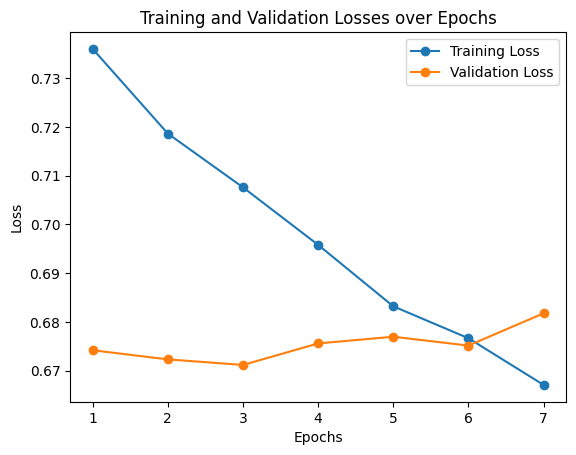

In [47]:
# Call the training function using our dataloader
train_siamese_network(modelZ,train_dataloader1,valid_dataloader ,device , num_epochs=7)

## Resnet - 18 , 4 unfreeze Layer + Regularisation + Early stopping + LRS + Adam

Epoch [1/15], Train Loss: 0.6522, Val Loss: 0.6760
Epoch [2/15], Train Loss: 0.6406, Val Loss: 0.7128
Epoch [3/15], Train Loss: 0.6444, Val Loss: 0.6475
Epoch [4/15], Train Loss: 0.6402, Val Loss: 0.6503
Epoch [5/15], Train Loss: 0.6411, Val Loss: 0.6484
Epoch 00005: reducing learning rate of group 0 to 1.0000e-03.
Epoch [6/15], Train Loss: 0.5874, Val Loss: 0.5975
Epoch [7/15], Train Loss: 0.5714, Val Loss: 0.6063
Epoch [8/15], Train Loss: 0.5660, Val Loss: 0.5934
Epoch [9/15], Train Loss: 0.5625, Val Loss: 0.5902
Epoch [10/15], Train Loss: 0.5596, Val Loss: 0.5826
Epoch [11/15], Train Loss: 0.5592, Val Loss: 0.5878
Epoch [12/15], Train Loss: 0.5592, Val Loss: 0.6242
Epoch 00012: reducing learning rate of group 0 to 1.0000e-04.
Epoch [13/15], Train Loss: 0.5414, Val Loss: 0.5858
Early stopping triggered after 13 epochs.


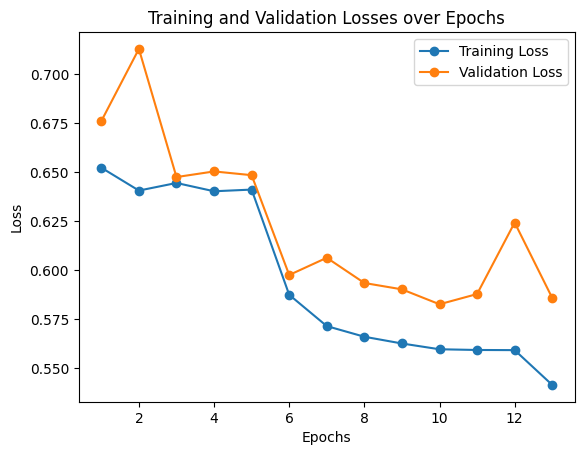

In [52]:
train_siamese_network2(modelR, train_dataloader, valid_dataloader, device, 
                          num_epochs=15, learning_rate=0.01, weight_decay=0.0005,
                          patience=3, scheduler_type= "ReduceLROnPlateau", step_size=10, gamma=0.1,
                          optimizer_type="Adam")

## Ef-NET witn No augmentation 2 unfreeze layer + Regularisation  / Early Stopping

Epoch [1/15], Train Loss: 0.7480, Val Loss: 0.6633
Epoch [2/15], Train Loss: 0.7594, Val Loss: 0.6857
Epoch [3/15], Train Loss: 0.7496, Val Loss: 0.6745
Epoch 00003: reducing learning rate of group 0 to 1.0000e-03.
Epoch [4/15], Train Loss: 0.7325, Val Loss: 0.6718
Early stopping triggered after 4 epochs.


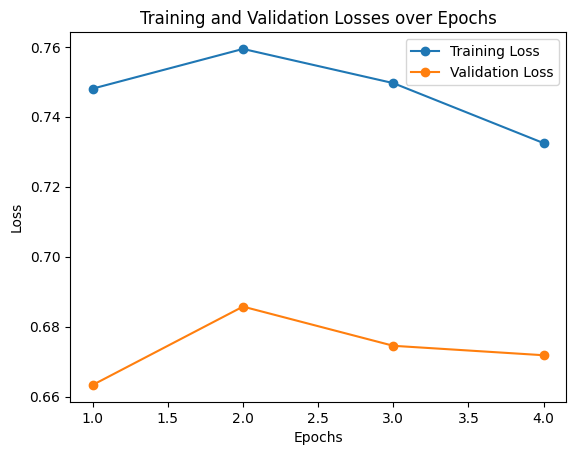

In [37]:
train_siamese_network2(modelZ, train_dataloader1, valid_dataloader, device, 
                          num_epochs=15, learning_rate=0.01, weight_decay=0.0005,
                          patience=3, scheduler_type= "ReduceLROnPlateau", step_size=10, gamma=0.1,
                          optimizer_type="Adam")

## Training EF-Net 2 unfreeze Layer + Augmentation

Epoch [1/15], Train Loss: 0.6274, Val Loss: 0.6508
Epoch [2/15], Train Loss: 0.6234, Val Loss: 0.6757
Epoch [3/15], Train Loss: 0.6249, Val Loss: 0.6581
Epoch 00003: reducing learning rate of group 0 to 1.0000e-03.
Epoch [4/15], Train Loss: 0.5875, Val Loss: 0.6240
Epoch [5/15], Train Loss: 0.5765, Val Loss: 0.6464
Epoch [6/15], Train Loss: 0.5737, Val Loss: 0.6216
Epoch [7/15], Train Loss: 0.5702, Val Loss: 0.6271
Epoch [8/15], Train Loss: 0.5685, Val Loss: 0.6130
Epoch [9/15], Train Loss: 0.5663, Val Loss: 0.6134
Epoch [10/15], Train Loss: 0.5655, Val Loss: 0.6393
Epoch 00010: reducing learning rate of group 0 to 1.0000e-04.
Epoch [11/15], Train Loss: 0.5542, Val Loss: 0.6080
Epoch [12/15], Train Loss: 0.5467, Val Loss: 0.6084
Epoch [13/15], Train Loss: 0.5433, Val Loss: 0.6074
Epoch [14/15], Train Loss: 0.5410, Val Loss: 0.6089
Epoch [15/15], Train Loss: 0.5385, Val Loss: 0.6206
Epoch 00015: reducing learning rate of group 0 to 1.0000e-05.


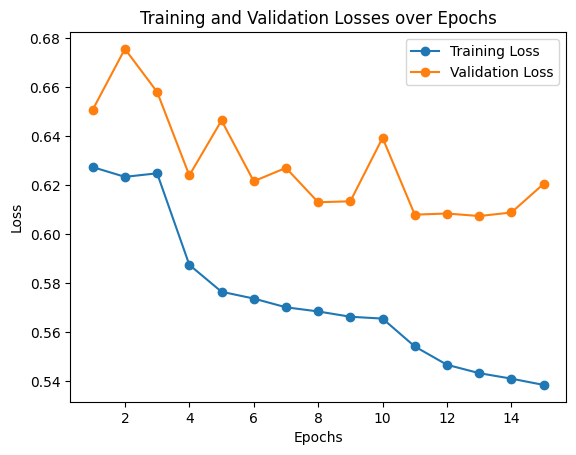

In [32]:
train_siamese_network2(modelY, train_dataloader, valid_dataloader, device, 
                          num_epochs=15, learning_rate=0.01, weight_decay=0.0005,
                          patience=3, scheduler_type= "ReduceLROnPlateau", step_size=10, gamma=0.1,
                          optimizer_type="Adam")

## Adagrad with Reduce on PLateau LRS

Epoch [1/15], Train Loss: 0.5839, Val Loss: 0.6479
Epoch [2/15], Train Loss: 0.5612, Val Loss: 0.6423
Epoch [3/15], Train Loss: 0.5529, Val Loss: 0.6497
Epoch [4/15], Train Loss: 0.5486, Val Loss: 0.6391
Epoch [5/15], Train Loss: 0.5442, Val Loss: 0.6388
Epoch [6/15], Train Loss: 0.5400, Val Loss: 0.6366
Epoch [7/15], Train Loss: 0.5373, Val Loss: 0.6333
Epoch [8/15], Train Loss: 0.5341, Val Loss: 0.6276
Epoch [9/15], Train Loss: 0.5327, Val Loss: 0.6218
Epoch [10/15], Train Loss: 0.5297, Val Loss: 0.6475
Epoch [11/15], Train Loss: 0.5279, Val Loss: 0.6198
Epoch [12/15], Train Loss: 0.5263, Val Loss: 0.6371
Epoch [13/15], Train Loss: 0.5247, Val Loss: 0.6341
Epoch 00013: reducing learning rate of group 0 to 1.0000e-03.
Epoch [14/15], Train Loss: 0.5158, Val Loss: 0.6344
Early stopping triggered after 14 epochs.


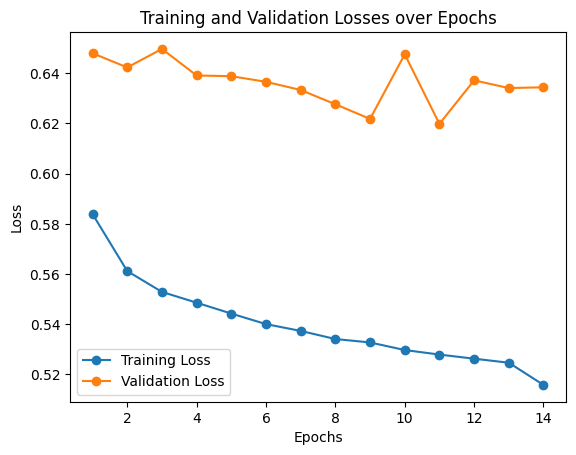

In [ ]:
train_siamese_network2(modelW, train_dataloader, valid_dataloader, device, 
                          num_epochs=15, learning_rate=0.01, weight_decay=0.0005,
                          patience=3, scheduler_type= "ReduceLROnPlateau", step_size=10, gamma=0.1,
                          optimizer_type="Adagrad")

## Reduce on Pleateau with Adam

Epoch [1/15], Train Loss: 0.6023, Val Loss: 0.6686
Epoch [2/15], Train Loss: 0.5856, Val Loss: 0.6547
Epoch [3/15], Train Loss: 0.5814, Val Loss: 0.6366
Epoch [4/15], Train Loss: 0.5799, Val Loss: 0.6650
Epoch [5/15], Train Loss: 0.5792, Val Loss: 0.6289
Epoch [6/15], Train Loss: 0.5774, Val Loss: 0.6450
Epoch [7/15], Train Loss: 0.5766, Val Loss: 0.6474
Epoch 00007: reducing learning rate of group 0 to 1.0000e-03.
Epoch [8/15], Train Loss: 0.5585, Val Loss: 0.6265
Epoch [9/15], Train Loss: 0.5553, Val Loss: 0.6224
Epoch [10/15], Train Loss: 0.5509, Val Loss: 0.6247
Epoch [11/15], Train Loss: 0.5481, Val Loss: 0.6194
Epoch [12/15], Train Loss: 0.5475, Val Loss: 0.6187
Epoch [13/15], Train Loss: 0.5460, Val Loss: 0.6163
Epoch [14/15], Train Loss: 0.5455, Val Loss: 0.6186
Epoch [15/15], Train Loss: 0.5440, Val Loss: 0.6191
Epoch 00015: reducing learning rate of group 0 to 1.0000e-04.


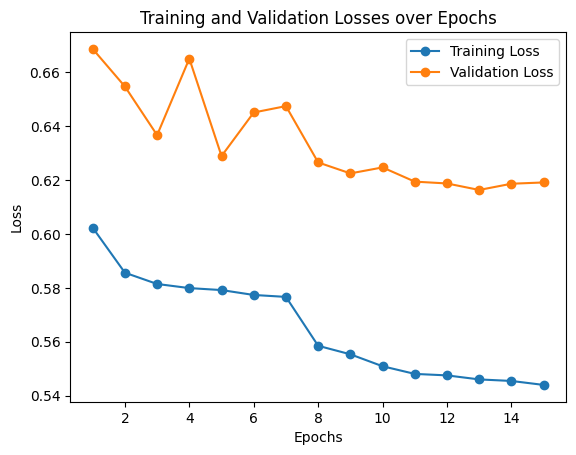

In [ ]:
train_siamese_network2(modelW, train_dataloader, valid_dataloader, device, 
                          num_epochs=15, learning_rate=0.01, weight_decay=0.0001,
                          patience=3, scheduler_type= "ReduceLROnPlateau", step_size=10, gamma=0.1,
                          optimizer_type="Adam")

## Reduce On Plateau with SGD

Epoch [1/15], Train Loss: 0.6472, Val Loss: 0.6730
Epoch [2/15], Train Loss: 0.6056, Val Loss: 0.6614
Epoch [3/15], Train Loss: 0.5880, Val Loss: 0.6522
Epoch [4/15], Train Loss: 0.5774, Val Loss: 0.6521
Epoch [5/15], Train Loss: 0.5697, Val Loss: 0.6439
Epoch [6/15], Train Loss: 0.5645, Val Loss: 0.6425
Epoch [7/15], Train Loss: 0.5598, Val Loss: 0.6479
Epoch [8/15], Train Loss: 0.5568, Val Loss: 0.6497
Epoch 00008: reducing learning rate of group 0 to 1.0000e-03.
Epoch [9/15], Train Loss: 0.5509, Val Loss: 0.6468
Early stopping triggered after 9 epochs.


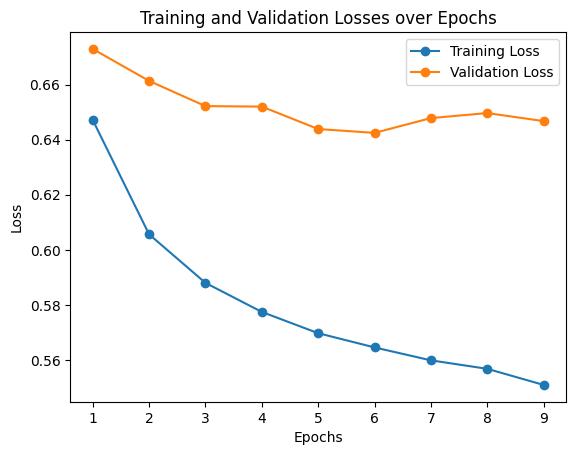

In [ ]:
train_siamese_network2(modelW, train_dataloader, valid_dataloader, device, 
                          num_epochs=15, learning_rate=0.01, weight_decay=0.0005,
                          patience=3, scheduler_type= "ReduceLROnPlateau", step_size=10, gamma=0.1,
                          optimizer_type="SGD")


## ADAM with No Scheduler

Epoch [1/10], Train Loss: 0.6163, Val Loss: 0.6862
Epoch [2/10], Train Loss: 0.6027, Val Loss: 0.6538
Epoch [3/10], Train Loss: 0.6001, Val Loss: 0.6381
Epoch [4/10], Train Loss: 0.5948, Val Loss: 0.6441
Epoch [5/10], Train Loss: 0.5933, Val Loss: 0.6632
Epoch [6/10], Train Loss: 0.5934, Val Loss: 0.6631
Epoch [7/10], Train Loss: 0.5922, Val Loss: 0.6859
Epoch [8/10], Train Loss: 0.5906, Val Loss: 0.6495
Early stopping triggered after 8 epochs.


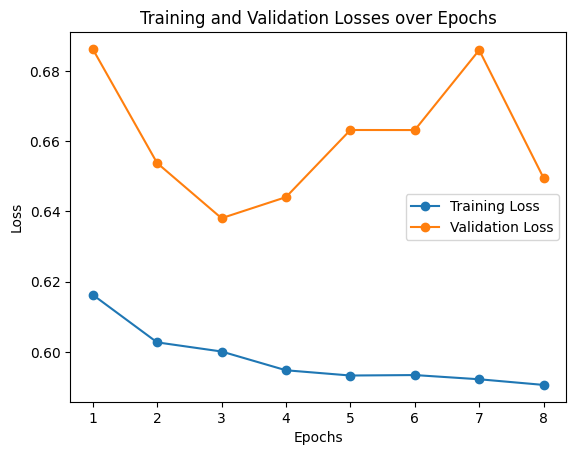

In [ ]:
train_siamese_network2(modelW, train_dataloader, valid_dataloader, device, 
                          num_epochs=15, learning_rate=0.01, weight_decay=0.0005,
                          patience=5, scheduler_type=None, step_size=10, gamma=0.1,
                          optimizer_type="Adam")

## SGD with NO Scheduler

Epoch [1/10], Train Loss: 0.6478, Val Loss: 0.6722
Epoch [2/10], Train Loss: 0.6041, Val Loss: 0.6647
Epoch [3/10], Train Loss: 0.5889, Val Loss: 0.6540
Epoch [4/10], Train Loss: 0.5760, Val Loss: 0.6426
Epoch [5/10], Train Loss: 0.5695, Val Loss: 0.6440
Epoch [6/10], Train Loss: 0.5642, Val Loss: 0.6391
Epoch [7/10], Train Loss: 0.5603, Val Loss: 0.6372
Epoch [8/10], Train Loss: 0.5569, Val Loss: 0.6389
Epoch [9/10], Train Loss: 0.5528, Val Loss: 0.6353
Epoch [10/10], Train Loss: 0.5500, Val Loss: 0.6351


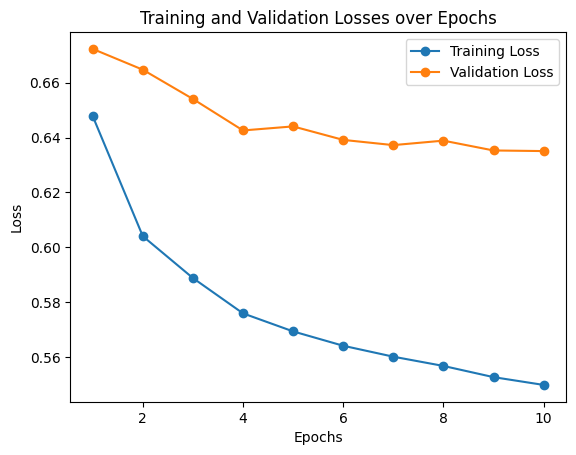

In [ ]:
train_siamese_network2(modelW, train_dataloader, valid_dataloader, device, 
                          num_epochs=10, learning_rate=0.01, weight_decay=0.0005,
                          patience=5, scheduler_type=None, step_size=10, gamma=0.1,
                          optimizer_type="SGD")

# Adam with Step LR

Epoch [1/15], Train Loss: 0.6211, Val Loss: 0.6984
Epoch [2/15], Train Loss: 0.6084, Val Loss: 0.6785
Epoch [3/15], Train Loss: 0.6043, Val Loss: 0.6960
Epoch [4/15], Train Loss: 0.6003, Val Loss: 0.6802
Epoch [5/15], Train Loss: 0.6015, Val Loss: 0.6931
Epoch [6/15], Train Loss: 0.5780, Val Loss: 0.6547
Epoch [7/15], Train Loss: 0.5715, Val Loss: 0.6555
Epoch [8/15], Train Loss: 0.5674, Val Loss: 0.6473
Epoch [9/15], Train Loss: 0.5654, Val Loss: 0.6448
Epoch [10/15], Train Loss: 0.5637, Val Loss: 0.6435
Epoch [11/15], Train Loss: 0.5544, Val Loss: 0.6386
Epoch [12/15], Train Loss: 0.5527, Val Loss: 0.6357
Epoch [13/15], Train Loss: 0.5509, Val Loss: 0.6339
Epoch [14/15], Train Loss: 0.5509, Val Loss: 0.6341
Epoch [15/15], Train Loss: 0.5510, Val Loss: 0.6319


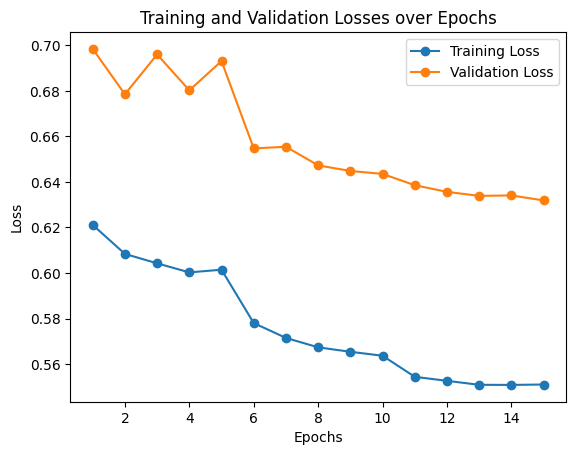

In [ ]:
train_siamese_network2(modelY, train_dataloader, valid_dataloader, device, 
                          num_epochs=15, learning_rate=0.01, weight_decay=0.0005,
                          patience=5, scheduler_type="StepLR", step_size=5, gamma=0.1,
                          optimizer_type="Adam")

Epoch [1/15], Train Loss: 0.5976, Val Loss: 0.6642
Epoch [2/15], Train Loss: 0.6000, Val Loss: 0.6561
Epoch [3/15], Train Loss: 0.5997, Val Loss: 0.6424
Epoch [4/15], Train Loss: 0.6001, Val Loss: 0.6365
Epoch [5/15], Train Loss: 0.6009, Val Loss: 0.6515
Epoch [6/15], Train Loss: 0.5791, Val Loss: 0.6449
Early stopping triggered after 6 epochs.


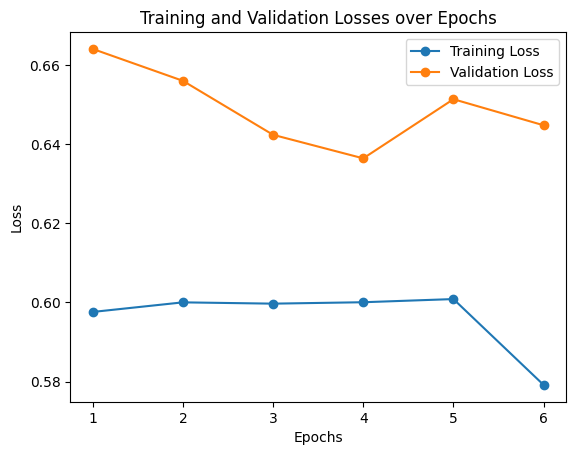

In [66]:
train_siamese_network2(modelY, train_dataloader, valid_dataloader, device, 
                          num_epochs=15, learning_rate=0.01, weight_decay=0.0005,
                          patience=2, scheduler_type="StepLR", step_size=5, gamma=0.1,
                          optimizer_type="Adam")

## Adam With Exponential LR

Epoch [1/15], Train Loss: 0.6207, Val Loss: 0.6913
Epoch [2/15], Train Loss: 0.5823, Val Loss: 0.6388
Epoch [3/15], Train Loss: 0.5680, Val Loss: 0.6452
Epoch [4/15], Train Loss: 0.5644, Val Loss: 0.6473
Epoch [5/15], Train Loss: 0.5640, Val Loss: 0.6466
Epoch [6/15], Train Loss: 0.5634, Val Loss: 0.6493
Epoch [7/15], Train Loss: 0.5638, Val Loss: 0.6465
Early stopping triggered after 7 epochs.


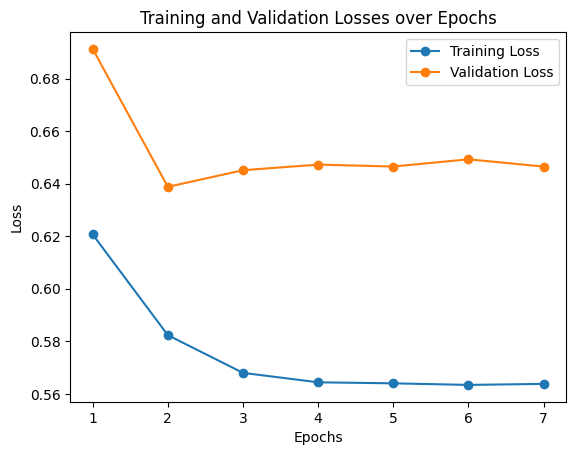

In [63]:
train_siamese_network2(modelW, train_dataloader, valid_dataloader, device, 
                          num_epochs=15, learning_rate=0.01, weight_decay=0.0005,
                          patience=5, scheduler_type="ExponentialLR", step_size=5, gamma=0.1,
                          optimizer_type="Adam")

## Simple Loop, Ef-Net , 6 Unfreeze layer , No Dropout 

Epoch [1/7], Train Loss: 0.5893, Val Loss: 0.6238
Epoch [2/7], Train Loss: 0.5619, Val Loss: 0.6119
Epoch [3/7], Train Loss: 0.5529, Val Loss: 0.6198
Epoch [4/7], Train Loss: 0.5455, Val Loss: 0.6042
Epoch [5/7], Train Loss: 0.5387, Val Loss: 0.6092
Epoch [6/7], Train Loss: 0.5292, Val Loss: 0.6159
Epoch [7/7], Train Loss: 0.5234, Val Loss: 0.6162


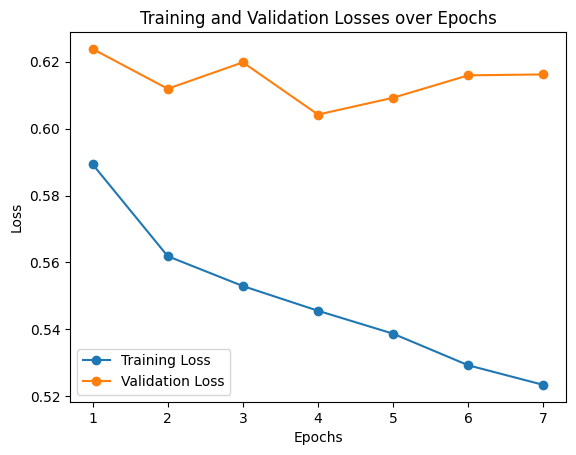

In [75]:
train_siamese_network(modelZ,train_dataloader,valid_dataloader ,device , num_epochs=7)

##  Ef-Net , 6 Unfreeze layer , With Dropout 

Epoch [1/15], Train Loss: 0.6311, Val Loss: 0.6876
Epoch [2/15], Train Loss: 0.6159, Val Loss: 0.6503
Epoch [3/15], Train Loss: 0.6130, Val Loss: 0.6802
Epoch [4/15], Train Loss: 0.6101, Val Loss: 0.6740
Epoch 00004: reducing learning rate of group 0 to 1.0000e-03.
Epoch [5/15], Train Loss: 0.5838, Val Loss: 0.6333
Epoch [6/15], Train Loss: 0.5753, Val Loss: 0.6343
Epoch [7/15], Train Loss: 0.5708, Val Loss: 0.6421
Epoch 00007: reducing learning rate of group 0 to 1.0000e-04.
Epoch [8/15], Train Loss: 0.5606, Val Loss: 0.6453
Early stopping triggered after 8 epochs.


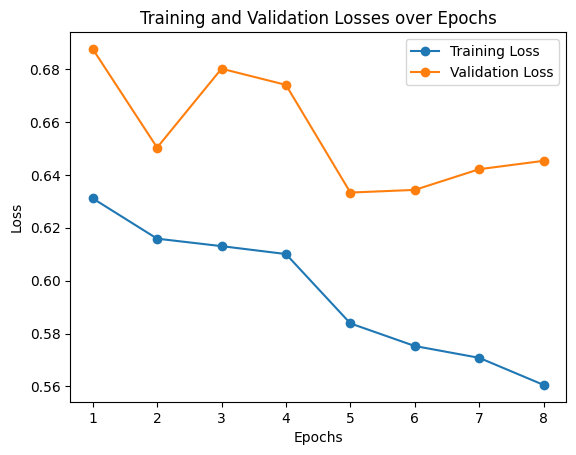

In [57]:
train_siamese_network2(modelW, train_dataloader, valid_dataloader, device, 
                          num_epochs=15, learning_rate=0.01, weight_decay=0.0005,
                          patience=3, scheduler_type= "ReduceLROnPlateau", step_size=10, gamma=0.1,
                          optimizer_type="Adam")

Epoch [1/6], Train Loss: 0.6139, Val Loss: 0.6905
Epoch [2/6], Train Loss: 0.5958, Val Loss: 0.6906
Epoch [3/6], Train Loss: 0.5931, Val Loss: 0.6899
Epoch [4/6], Train Loss: 0.5910, Val Loss: 0.6898
Epoch [5/6], Train Loss: 0.5900, Val Loss: 0.6843
Epoch [6/6], Train Loss: 0.5889, Val Loss: 0.6930


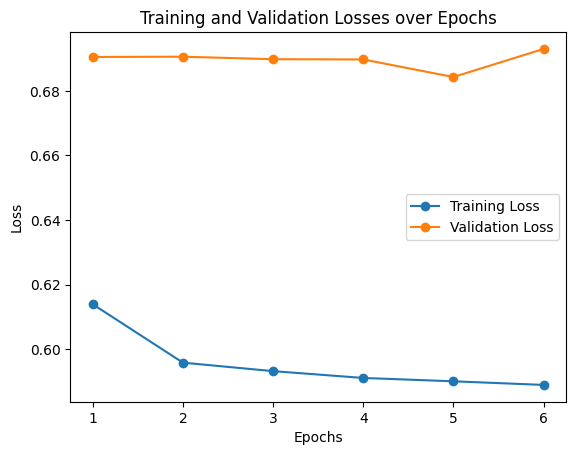

In [49]:
train_siamese_network(modelZ,train_dataloader,valid_dataloader ,device , num_epochs=6)

Epoch [1/15], Train Loss: 0.6209, Val Loss: 0.6494
Epoch [2/15], Train Loss: 0.6050, Val Loss: 0.6517
Epoch [3/15], Train Loss: 0.6002, Val Loss: 0.6411
Epoch [4/15], Train Loss: 0.5966, Val Loss: 0.6511
Epoch [5/15], Train Loss: 0.5934, Val Loss: 0.6473
Epoch [6/15], Train Loss: 0.5918, Val Loss: 0.6400
Epoch [7/15], Train Loss: 0.5898, Val Loss: 0.6538
Epoch [8/15], Train Loss: 0.5905, Val Loss: 0.6531
Epoch [9/15], Train Loss: 0.5910, Val Loss: 0.6591
Epoch 00009: reducing learning rate of group 0 to 5.0000e-04.
Epoch [10/15], Train Loss: 0.5718, Val Loss: 0.6376
Epoch [11/15], Train Loss: 0.5687, Val Loss: 0.6342
Epoch [12/15], Train Loss: 0.5659, Val Loss: 0.6300
Epoch [13/15], Train Loss: 0.5641, Val Loss: 0.6287
Epoch [14/15], Train Loss: 0.5644, Val Loss: 0.6290
Epoch [15/15], Train Loss: 0.5614, Val Loss: 0.6275


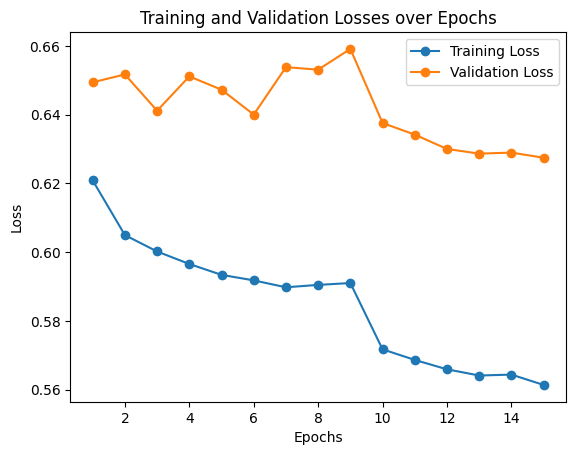

In [82]:
train_siamese_network2(modelY, train_dataloader, valid_dataloader, device, 
                          num_epochs=15, learning_rate=0.005, weight_decay=0.001, 
                          patience=4, scheduler_type="ReduceLROnPlateau", step_size=5, gamma=0.1)

## Resnet With Hingle Loss

Epoch [1/10], Train Loss: 0.0009, Val Loss: 0.0000
Epoch [2/10], Train Loss: 0.0007, Val Loss: 0.0053
Epoch [3/10], Train Loss: 0.0008, Val Loss: 0.0000
Epoch 00003: reducing learning rate of group 0 to 1.0000e-04.
Epoch [4/10], Train Loss: 0.0003, Val Loss: 0.0002
Early stopping triggered after 4 epochs.


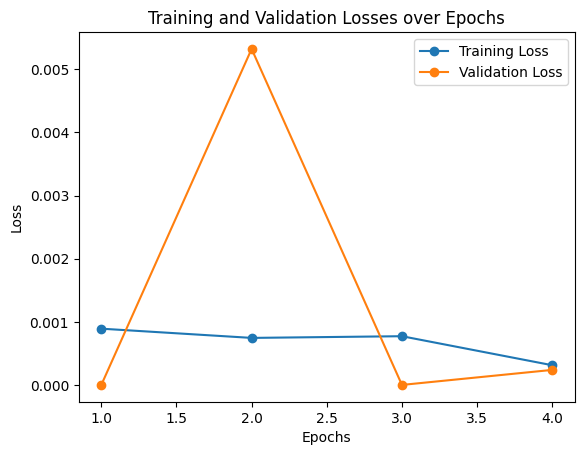

In [77]:
train_siamese_networkH(modelR, train_dataloader, valid_dataloader, device, 
                          num_epochs=10, learning_rate=0.001, weight_decay=0.0005,  
                          patience=3, scheduler_type="ReduceLROnPlateau", step_size=5, gamma=0.1)

In [88]:
train_siamese_network2(modelY, train_dataloader, valid_dataloader, device, 
                          num_epochs=15, learning_rate=0.005, weight_decay=0.001,  # <-- Add weight_decay argument
                          patience=4, scheduler_type="ReduceLROnPlateau", step_size=5, gamma=0.1 ,)

Exception ignored in: <function _releaseLock at 0x7f4d3c358cc0>
Traceback (most recent call last):
  File "/home/cminds/miniconda3/envs/AML782/lib/python3.11/logging/__init__.py", line 237, in _releaseLock
    def _releaseLock():
    
KeyboardInterrupt: 


# Testing the Model

In [73]:
def test_accuracy(model, dataloader, device, threshold=0.5):
    model.eval()  # Set model to evaluation mode

    correct = 0
    total = 0
    true_positives = 0
    true_negatives = 0
    false_positives = 0
    false_negatives = 0
    
    cosine_similarity = nn.CosineSimilarity(dim=1)

    with torch.no_grad():
        for data in dataloader:
            images1, images2, labels = [d.to(device) for d in data]
            output1, output2 = model(images1, images2)
            similarity = cosine_similarity(output1, output2)
            predicted = (similarity > threshold).float()
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            true_positives += ((predicted == 1) & (labels == 1)).sum().item() #confusion matrix
            true_negatives += ((predicted == 0) & (labels == 0)).sum().item()
            false_positives += ((predicted == 1) & (labels == 0)).sum().item()
            false_negatives += ((predicted == 0) & (labels == 1)).sum().item()

    accuracy = 100 * correct / total
    metrics = {
        "accuracy": accuracy,
        "true_positives": true_positives,
        "true_negatives": true_negatives,
        "false_positives": false_positives,
        "false_negatives": false_negatives
    }

    return metrics

In [29]:
def compute_accuracy_and_confusion_matrix(model, dataloader, device, threshold=0.5):
    model.eval()
    true_labels = []
    predicted_labels = []
    with torch.no_grad():
        for (img1, img2, labels) in dataloader:
            img1, img2, labels = img1.to(device), img2.to(device), labels.to(device)
            emb1, emb2 = model(img1, img2)
            distances = F.pairwise_distance(emb1, emb2)
            preds = (distances < threshold).float()  # distance less than threshold means similar, so predicted label=1
            true_labels.extend(labels.cpu().numpy())
            predicted_labels.extend(preds.cpu().numpy())
    
    # Compute accuracy
    correct_preds = sum([1 for true, pred in zip(true_labels, predicted_labels) if true == pred])
    accuracy = correct_preds / len(true_labels)
    accuracy *= 100
    print("accuracy : ", accuracy)
    cm = confusion_matrix(true_labels, predicted_labels)
    
    return accuracy, cm

In [59]:
def denormalize(tensor, mean, std):
    """Denormalizes an image tensor and clips its values."""
    for t, m, s in zip(tensor, mean, std):
        t.mul_(s).add_(m)
    return tensor.clamp(0, 1)


mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

In [64]:
def test_accuracy2(model, dataloader, device, threshold=0.5, num_samples=5):
    model.eval()  # Set model to evaluation mode

    correct = 0
    total = 0
    true_positives = 0
    true_negatives = 0
    false_positives = 0
    false_negatives = 0
    saved_samples = []  # List to save the samples
    
    cosine_similarity = nn.CosineSimilarity(dim=1)

    with torch.no_grad():
        for data in dataloader:
            images1, images2, labels = [d.to(device) for d in data]
            output1, output2 = model(images1, images2)
            similarity = cosine_similarity(output1, output2)
            predicted = (similarity > threshold).float()
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            # Save samples
            for i in range(predicted.size(0)):
                if len(saved_samples) < num_samples:
                    saved_samples.append((images1[i].cpu(), images2[i].cpu(), labels[i].item(), predicted[i].item()))

            true_positives += ((predicted == 1) & (labels == 1)).sum().item() #confusion matrix
            true_negatives += ((predicted == 0) & (labels == 0)).sum().item()
            false_positives += ((predicted == 1) & (labels == 0)).sum().item()
            false_negatives += ((predicted == 0) & (labels == 1)).sum().item()

    accuracy = 100 * correct / total
    metrics = {
        "accuracy": accuracy,
        "true_positives": true_positives,
        "true_negatives": true_negatives,
        "false_positives": false_positives,
        "false_negatives": false_negatives
    }
    # Inside your test_accuracy function, before plotting:

    for i, (img1, img2, true_label, pred_label) in enumerate(saved_samples):
        img1 = denormalize(img1.clone(), mean, std)
        img2 = denormalize(img2.clone(), mean, std)

        # Explicitly clip the values if required
        img1 = img1.clamp(0, 1)
        img2 = img2.clamp(0, 1)

        # Now plot the images as before...

    
    # Plot saved samples
    plt.figure(figsize=(20, 15))
    
    headers = ["Image 1", "Image 2", "True Label", "Predicted Label"]

    for i, (img1, img2, true_label, pred_label) in enumerate(saved_samples):
        plt.subplot(num_samples, 4, 4*i+1)
        plt.imshow(img1.permute(1, 2, 0))
        plt.axis('off')
        if i == 0:  # if it's the first row
            plt.title(headers[0])

        plt.subplot(num_samples, 4, 4*i+2)
        plt.imshow(img2.permute(1, 2, 0))
        plt.axis('off')
        if i == 0:  # if it's the first row
            plt.title(headers[1])

        plt.subplot(num_samples, 4, 4*i+3)
        plt.text(0.5, 0.5, str(true_label), fontsize=15, ha='center', va='center')
        plt.axis('off')
        if i == 0:  # if it's the first row
            plt.title(headers[2])

        plt.subplot(num_samples, 4, 4*i+4)
        plt.text(0.5, 0.5, str(pred_label), fontsize=15, ha='center', va='center')
        plt.axis('off')
        if i == 0:  # if it's the first row
            plt.title(headers[3])
        
    plt.tight_layout()
    plt.show()

    return metrics

## Training EF-Net 2 unfreeze Layer + No Augmentation + Dropout

In [74]:
metrics = test_accuracy(modelW, test_dataloader, device)
print(metrics)

{'accuracy': 63.833333333333336, 'true_positives': 198, 'true_negatives': 185, 'false_positives': 115, 'false_negatives': 102}


In [75]:
metrics = test_accuracy(modelW, test_dataloader, device)
print(metrics)

{'accuracy': 68.5, 'true_positives': 212, 'true_negatives': 199, 'false_positives': 101, 'false_negatives': 88}


## Training EF-Net 2 unfreeze Layer + NoAugmentation

In [48]:
metrics = test_accuracy(modelZ, train_dataloader1, device)
print(metrics)

{'accuracy': 50.0, 'true_positives': 1000, 'true_negatives': 0, 'false_positives': 1000, 'false_negatives': 0}


## Resnet - 18 , 4 unfreeze Layer + Regularisation + Early stopping + LRS + Adam

In [57]:
metrics = test_accuracy(modelR, valid_dataloader, device)
print(metrics)

{'accuracy': 72.33333333333333, 'true_positives': 197, 'true_negatives': 237, 'false_positives': 63, 'false_negatives': 103}


In [58]:
metrics = test_accuracy(modelR, test_dataloader, device)
print(metrics)

{'accuracy': 70.33333333333333, 'true_positives': 186, 'true_negatives': 236, 'false_positives': 64, 'false_negatives': 114}


## Training EF-Net 2 unfreeze Layer + Augmentation

In [35]:
metrics = test_accuracy(modelY, valid_dataloader, device)
print(metrics)

{'accuracy': 73.16666666666667, 'true_positives': 206, 'true_negatives': 233, 'false_positives': 67, 'false_negatives': 94}


## Reduce on Pleareatu Scheduler  with Adam

In [70]:
metrics = test_accuracy(modelW, test_dataloader, device)
print(metrics)

{'accuracy': 71.83333333333333, 'true_positives': 192, 'true_negatives': 239, 'false_positives': 61, 'false_negatives': 108}


## Step LR with Adam

In [64]:
metrics = test_accuracy(modelY, valid_dataloader, device)
print(metrics)

{'accuracy': 68.33333333333333, 'true_positives': 199, 'true_negatives': 211, 'false_positives': 89, 'false_negatives': 101}


In [65]:
metrics = test_accuracy(modelY, test_dataloader, device)
print(metrics)

{'accuracy': 68.83333333333333, 'true_positives': 191, 'true_negatives': 222, 'false_positives': 78, 'false_negatives': 109}


## Adagrad with LR SCheduler

In [58]:
metrics = test_accuracy(modelW, train_dataloader, device)
print(metrics)

{'accuracy': 93.82916666666667, 'true_positives': 11352, 'true_negatives': 11167, 'false_positives': 833, 'false_negatives': 648}


In [57]:
metrics = test_accuracy(modelW, valid_dataloader, device)
print(metrics)

{'accuracy': 73.83333333333333, 'true_positives': 210, 'true_negatives': 233, 'false_positives': 67, 'false_negatives': 90}


## Zero Unfreeze Layer

In [50]:
metrics = test_accuracy(modelZ, train_dataloader, device)
print(metrics)

{'accuracy': 84.9125, 'true_positives': 9481, 'true_negatives': 10898, 'false_positives': 1102, 'false_negatives': 2519}


In [52]:
metrics = test_accuracy(modelZ, valid_dataloader, device)
print(metrics)

{'accuracy': 63.0, 'true_positives': 217, 'true_negatives': 161, 'false_positives': 139, 'false_negatives': 83}


## ADAM with regularisation without LR

In [42]:
metrics = test_accuracy(modelW, train_dataloader, device)
print(metrics)

{'accuracy': 89.88333333333334, 'true_positives': 10922, 'true_negatives': 10650, 'false_positives': 1350, 'false_negatives': 1078}


In [41]:
metrics = test_accuracy(modelW, valid_dataloader, device)
print(metrics)

{'accuracy': 70.0, 'true_positives': 193, 'true_negatives': 227, 'false_positives': 73, 'false_negatives': 107}


## With Regularisation / Adam

In [85]:
metrics = test_accuracy(modelY, train_dataloader, device)
print(metrics)

{'accuracy': 83.715, 'true_positives': 8634, 'true_negatives': 8109, 'false_positives': 1891, 'false_negatives': 1366}


In [86]:
metrics = test_accuracy(modelY, valid_dataloader, device)
print(metrics)

{'accuracy': 70.16666666666667, 'true_positives': 209, 'true_negatives': 212, 'false_positives': 88, 'false_negatives': 91}


## Without regularisation , simple loop 

In [79]:
metrics = test_accuracy(modelZ, train_dataloader, device)
print(metrics)

{'accuracy': 92.915, 'true_positives': 9365, 'true_negatives': 9218, 'false_positives': 782, 'false_negatives': 635}


In [77]:
metrics = test_accuracy(modelZ, valid_dataloader, device)
print(metrics)

{'accuracy': 72.33333333333333, 'true_positives': 204, 'true_negatives': 230, 'false_positives': 70, 'false_negatives': 96}


# Saving and Loading models
        - Saving the model 

In [62]:
directory = "/home/cminds/CMInDS/Uddeshya/models_AML2"
model_path = os.path.join(directory, 'modelR6unfreeze_4best.pth')
torch.save(modelR.state_dict(), model_path)

        - Loading the model 

In [61]:
model = SiameseResNetWithCustomEmbedding(custom_embedding_dim=512)
model_path = "/home/cminds/CMInDS/Uddeshya/models_AML2/modelR6unfreeze_4best.pth"
model.load_state_dict(torch.load(model_path))
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelR = model.to(device)

In [62]:
model = SiameseEfficientNetWithCustomEmbedding(custom_embedding_dim=512)
model_path = "/home/cminds/CMInDS/Uddeshya/models_AML2/modelY6unfreeze_best.pth"
model.load_state_dict(torch.load(model_path))
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelNew = model.to(device)

### - Efnet with Cross Enropy loss 

In [61]:
metrics = test_accuracy(modelNew, valid_dataloader, device)
print(metrics)

{'accuracy': 75.83333333333333, 'true_positives': 201, 'true_negatives': 254, 'false_positives': 46, 'false_negatives': 99}


In [44]:
metrics = test_accuracy(modelNew, test_dataloader, device)
print(metrics)

{'accuracy': 76.16666666666667, 'true_positives': 200, 'true_negatives': 257, 'false_positives': 43, 'false_negatives': 100}


### - EfficientNet : 6 layer with Hinge Loss

In [90]:
compute_accuracy_and_confusion_matrix(modelR, valid_dataloader, device, threshold=14)

accuracy :  62.5


(62.5,
 array([[177, 123],
        [102, 198]]))

# 7. Experiment with at least two learning rate schedulers and comment on what works, doesn’t work, and potential reason why [1]
        -   ReduceLROnPlateau:(Best) This scheduler shone the brightest. How does it work? It monitors a specific metric and if there's no improvement for a pre-defined number of epochs , it reduces the learning rate. This adaptive nature is great because the model gets a 'nudge' when it seems to be stuck or not improving. By reducing the learning rate during these plateaus, the model can make smaller adjustments, potentially refining its performance and escaping stagnant periods.

        -   ExponentialLR:(Worst) This one didn't fare as well in my tests. It reduces the learning rate in every epoch by multiplying it with a pre-defined factor (less than 1). The continuous, aggressive reduction might have been too much for my model. If the learning rate drops too quickly, the model can lose the momentum to find and settle in the best regions of the parameter space, leading to suboptimal results.

        -   StepLR:(alright) This scheduler takes a middle-ground approach. It reduces the learning rate at regular, pre-defined intervals (steps).  This scheduler adjusted the learning rate at specific intervals. Its effectiveness was influenced by how I set the intervals. If the intervals were not optimally set, it might not have provided the best guidance for the model's learning.

Reference: https://www.youtube.com/watch?v=81NJgoR5RfY

# 8. Experiment with at least two different optimizers and comment on what works, doesn’t work, and potential reason why [1]

    - ADAM:(Best) Clearly the standout in my tests. So, what's under the hood of ADAM? It's an adaptive learning rate optimizer, which means it adjusts the learning rate for each parameter based on historical gradient data. This dynamic tweaking allows it to navigate the parameter space more adeptly, especially in the presence of noisy or sparse gradients. Its combination of momentum (borrowed from the concept of SGD with momentum) and component-wise scaling of the gradients (akin to Adagrad) gives it an edge in many scenarios. The result? Faster convergence and better generalization in my experiments.

    - Adagrad: Adagrad adjusts the learning rate of each parameter based on the historical sum of its gradients. The more frequently a parameter is updated, the smaller its learning rate becomes. While this can be great for sparse data, in my experiments, it seemed that the learning rates became too small, too quickly, causing the model's learning process to decelerate prematurely. This might have contributed to its underwhelming performance compared to ADAM.

    - SGD with Momentum: While basic SGD updates model parameters using a fixed learning rate based on a subset of the data (a mini-batch), adding momentum provides it a kind of memory of its past updates. The idea behind momentum is that if a parameter was moving in a particular direction in previous steps, it will likely continue moving in that direction in the upcoming steps. This can help the optimizer navigate valleys or saddle points faster and smooth out noisy gradients. However, despite the added momentum, SGD still lacks the component-wise adaptive learning rate adjustments found in ADAM and Adagrad. In my experiments, this might be a contributing factor for its performance being outpaced by ADAM. Yet, the effectiveness of SGD with momentum can vary based on the chosen momentum value and the specific challenges of the dataset at hand.

# 9. Test on the test split [1]

### - EfficientNet : 6 layer Unfreeze Perfomance on the test set with Augmentation / Adam / ReduceOnPlateau / Regularisation 

In [122]:
metrics = test_accuracy(modelNew, test_dataloader, device)
print(metrics)

{'accuracy': 77.8, 'true_positives': 176, 'true_negatives': 213, 'false_positives': 37, 'false_negatives': 74}


### Model accuracy: 77.8 
### True_positives: 176 
### True_negatives: 213 
### False_positives: 37
### False_negatives: 74

In [101]:
metrics = test_accuracy(modelNew, valid_dataloader, device)
print(metrics)

{'accuracy': 75.83333333333333, 'true_positives': 201, 'true_negatives': 254, 'false_positives': 46, 'false_negatives': 99}


### - ResNet : 4 layer Unfreeze Perfomance on the test set with Augmentation / Adam / ReduceOnPlateau / Regularisation 

In [77]:
metrics = test_accuracy(modelR, valid_dataloader, device)
print(metrics)

{'accuracy': 71.66666666666667, 'true_positives': 214, 'true_negatives': 216, 'false_positives': 84, 'false_negatives': 86}


In [102]:
metrics = test_accuracy(modelR, test_dataloader, device)
print(metrics)

{'accuracy': 72.33333333333333, 'true_positives': 197, 'true_negatives': 237, 'false_positives': 63, 'false_negatives': 103}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

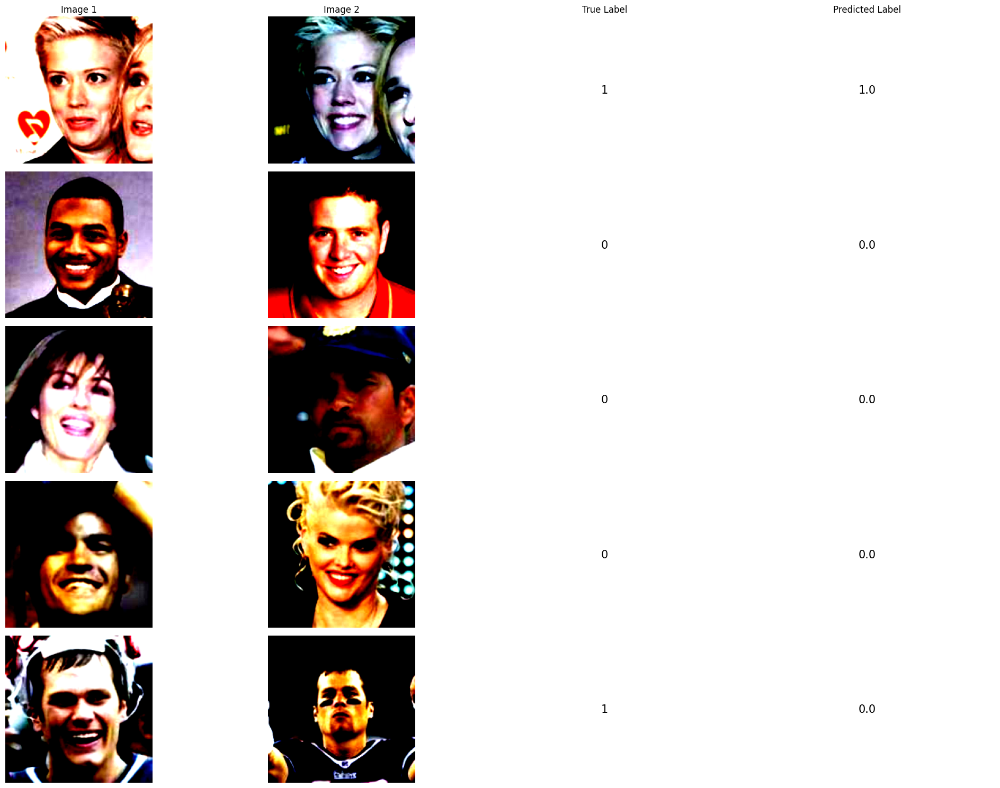

None


In [52]:
metrics = test_accuracy2(modelR, test_dataloader, device)
print(metrics)


## 10. Gather a few images of yourself and your friends (with their consent) and check if the model works well on this data [1]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

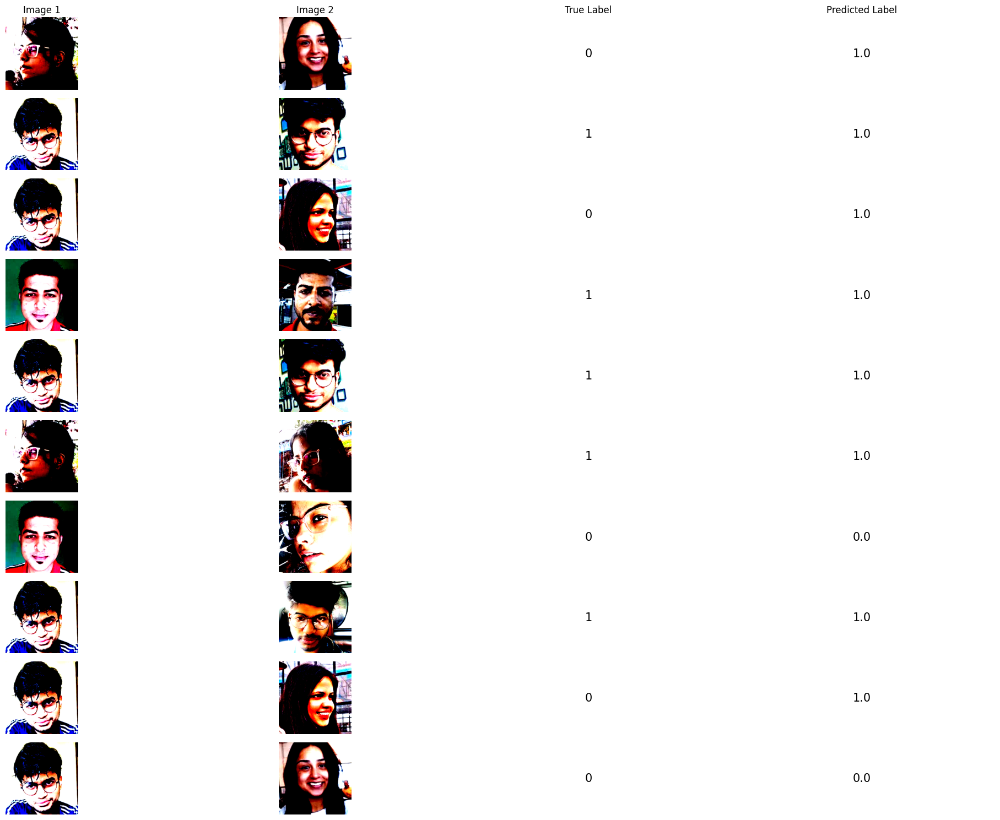

{'accuracy': 70.0, 'true_positives': 5, 'true_negatives': 2, 'false_positives': 3, 'false_negatives': 0}


In [81]:
metrics = test_accuracy2(modelNew, train_dataloader, device , num_samples=10)
print(metrics)

In [74]:
metrics = test_accuracy(modelNew, train_dataloader, device)
print(metrics)

{'accuracy': 70.0, 'true_positives': 5, 'true_negatives': 2, 'false_positives': 3, 'false_negatives': 0}


In [77]:
metrics = test_accuracy(modelR, train_dataloader, device)
print(metrics)

{'accuracy': 80.0, 'true_positives': 5, 'true_negatives': 3, 'false_positives': 2, 'false_negatives': 0}


### Model accuracy: 80.0 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

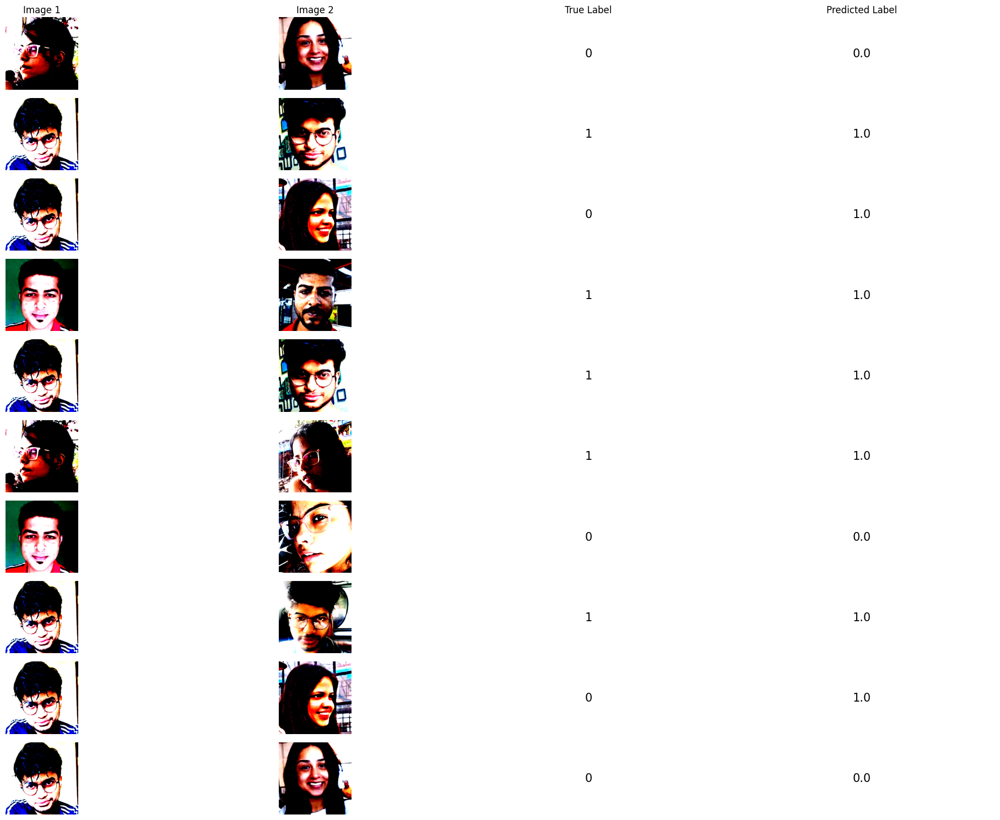

{'accuracy': 80.0, 'true_positives': 5, 'true_negatives': 3, 'false_positives': 2, 'false_negatives': 0}


In [79]:
metrics = test_accuracy2(modelR, train_dataloader, device , num_samples=10)
print(metrics)

## References
- [1] https://github.com/seanbenhur/siamese_net/tree/master/siamese-net
- [2] https://chat.openai.com/
- [3] https://www.youtube.com/watch?v=6jfw8MuKwpI
- [4] https://www.youtube.com/watch?v=DGJyh5dK4hU
- [5] https://www.youtube.com/watch?v=IXgr63eRU5U
- [6] https://www.youtube.com/watch?v=sQpPaW17TwU
